# **Optimizing Underwater Image Quality with Deep Reinforcement Learning**

<h3>Marc Anthony Reyes</h3>
<p>AI 322 RL</p>
<p>Mini Project</p>

In [1]:
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import (
    decode_predictions,
    preprocess_input,
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import (
    categorical_crossentropy,
    MeanAbsoluteError,
    MeanSquaredError,
)
from tensorflow.keras.models import (
    Model,
)
from tensorflow.keras.utils import get_file, load_img, plot_model

import numpy as np
import glob
import cv2 as cv
import time

from matplotlib import pyplot as plt
from skimage.metrics import (
    structural_similarity,
    peak_signal_noise_ratio,
    mean_squared_error,
)
from statistics import mean
from random import (
    sample,
    randrange,
)
from splitfolders import ratio as splitfolders_ratio
from shutil import rmtree
from imgaug import augmenters as iaa
from itertools import combinations_with_replacement
from collections import defaultdict
from PIL import ImageEnhance, Image
from IPython.display import clear_output

from gym import Env
from gym.spaces import Box, Discrete

2024-06-01 00:04:16.087779: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-01 00:04:16.087839: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-01 00:04:16.089077: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-01 00:04:16.096118: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-01 00:04:16.862019: W tensorflow/compiler/tf2

In [2]:
# Query the system for available GPU devices
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        # Enable memory growth on each GPU to avoid pre-allocation of all available GPU memory
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # List logical GPUs available after enabling memory growth
        logical_gpus = tf.config.list_logical_devices("GPU")
        # Print the count of physical and logical GPUs available
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Handle exception if memory growth is set after GPU devices have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


2024-06-01 00:04:18.950212: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-01 00:04:19.305415: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-01 00:04:19.305648: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [3]:
def plot_training_rewards(rewards, moving_avg_window_size=None):
    """
    Plot the training rewards and optionally the moving average of rewards.

    Args:
    rewards (list): List of reward values.
    moving_avg_window_size (int, optional): The window size for calculating the moving average. Defaults to None.

    """
    if moving_avg_window_size is not None:
        moving_avg_total_reward = []
        for i in range(len(rewards)):
            window = rewards[max(0, i - moving_avg_window_size + 1) : i + 1]
            window_avg = mean(window)
            moving_avg_total_reward.append(window_avg)

    fig, ax = plt.subplots(figsize=(15, 5))

    ax.plot(range(len(rewards)), rewards, label="Total reward", color="orange")
    ax.set_xlabel("Episodes")
    if moving_avg_window_size is not None:
        ax.plot(
            range(len(moving_avg_total_reward)),
            moving_avg_total_reward,
            label="Total reward moving average",
        )
        ax.legend(loc="upper left")


def show_image_grid(image_path, grid_size, image_size):
    """
    Display a grid of images randomly selected from the specified path.

    Args:
    image_path (list): List of paths to the images.
    grid_size (tuple): The grid size as (rows, columns).
    image_size (tuple): Size of the figure to display the grid.

    """
    fig = plt.figure(figsize=image_size)
    rows, columns = grid_size
    for i in range(1, columns * rows + 1):
        fn = np.random.choice(image_path)
        img = Image.open(fn)
        fig.add_subplot(rows, columns, i)
        plt.axis("off")
        plt.imshow(img)
    plt.show()


def compare_images(images, titles, image_size):
    """
    Compare multiple images by displaying them side by side with titles.

    Args:
    images (list): List of images to display.
    titles (list): Titles for each image.
    image_size (tuple): Size of the figure to display the images.

    """
    number_of_images = len(images)
    fig, axes = plt.subplots(1, number_of_images, figsize=image_size)
    for i in range(number_of_images):
        axes[i].imshow(images[i])
        axes[i].set_title(titles[i])
        axes[i].axis("off")
    plt.show()


def display_image(image) -> None:
    """
    Display a single image.

    Args:
    image (array-like): The image data to display.

    """
    plt.figure()
    plt.imshow(image)

# Dataset


The following [**dataset**](https://li-chongyi.github.io/proj_benchmark.html) contains 890 raw images (**raw images**) with corresponding high-quality reference images (**reference images**).
It also includes 60 images without a corresponding reference, defined as **challenge images**.


In [4]:
dataset_path = "underwater_dataset"
splitted_dataset_path = "splitted_dataset"

In [5]:
def split_dataset(training_set_size, test_set_size, validation_set_size):
    """
    Splits the dataset into training, testing, and validation sets based on specified ratios.

    This function first checks if a directory for the split dataset already exists, and if so, it removes it.
    Then, it uses the `splitfolders_ratio` function to split the dataset into training, testing, and validation
    sets according to the provided size ratios.

    Args:
    training_set_size (float): The proportion of the dataset to include in the training set.
    test_set_size (float): The proportion of the dataset to include in the test set.
    validation_set_size (float): The proportion of the dataset to include in the validation set.
    """
    # Check if the directory for the split dataset exists and remove it if it does
    if os.path.isdir(splitted_dataset_path):
        rmtree(splitted_dataset_path)

    # Split the dataset into training, testing, and validation sets
    splitfolders_ratio(
        dataset_path,
        output=splitted_dataset_path,
        ratio=(training_set_size, test_set_size, validation_set_size),
    )

In [6]:
# training_set_size = 0.6
# test_set_size = 0.2
# validation_set_size = 0.2

# split_dataset(training_set_size, test_set_size, validation_set_size)

## Analysis


In [7]:
images_raw = sorted(glob.glob(dataset_path + "/raw-890/*.png"), key=len)
images_ref = sorted(glob.glob(dataset_path + "/reference-890/*.png"), key=len)
print("Total number of raw images: ", len(images_raw))
print("Total number of reference images: ", len(images_ref))

images_raw_train = sorted(
    glob.glob(splitted_dataset_path + "/train/raw-890/*.png"), key=len
)
images_raw_test = sorted(
    glob.glob(splitted_dataset_path + "/test/raw-890/*.png"), key=len
)
images_raw_val = sorted(
    glob.glob(splitted_dataset_path + "/val/raw-890/*.png"), key=len
)
print("Total number of raw images for training: ", len(images_raw_train))
print("Total number of raw images for validation: ", len(images_raw_val))
print("Total number of raw images for testing: ", len(images_raw_test))

images_ref_train = sorted(
    glob.glob(splitted_dataset_path + "/train/reference-890/*.png"), key=len
)
images_ref_test = sorted(
    glob.glob(splitted_dataset_path + "/test/reference-890/*.png"), key=len
)
images_ref_val = sorted(
    glob.glob(splitted_dataset_path + "/val/reference-890/*.png"), key=len
)
print("Total number of reference images for training: ", len(images_ref_train))
print("Total number of reference images for validation: ", len(images_ref_val))
print("Total number of reference images for testing: ", len(images_ref_test))

Total number of raw images:  890
Total number of reference images:  890
Total number of raw images for training:  534
Total number of raw images for validation:  178
Total number of raw images for testing:  178
Total number of reference images for training:  534
Total number of reference images for validation:  178
Total number of reference images for testing:  178


In [8]:
def sample_images(source="train", target_size=None):
    """
    Randomly samples an image pair (raw and reference) from the specified dataset subset.

    Args:
    source (str): The subset of the dataset from which to sample ('train', 'test', or 'val').
                  Default is 'train'.
    target_size (tuple): The dimensions to which the images will be resized. Default is None,
                         meaning images will not be resized.

    Returns:
    tuple: A tuple containing two elements, the raw image and the reference image.
    """
    # Choose a random image path based on the source argument
    if source == "test":
        random_img_path = np.random.choice(images_raw_test)
    elif source == "val":
        random_img_path = np.random.choice(images_raw_val)
    else:
        random_img_path = np.random.choice(images_raw_train)

    # Extract the filename from the path
    random_img = random_img_path.split("/").pop()

    # Construct the full path for the raw image and load it
    file_raw = splitted_dataset_path + "/" + source + "/raw-890/" + random_img
    raw_img = load_img(path=file_raw, target_size=target_size)

    # Construct the full path for the reference image and load it
    file_ref = splitted_dataset_path + "/" + source + "/reference-890/" + random_img
    ref_img = load_img(path=file_ref, target_size=target_size)

    return raw_img, ref_img

As an example, some raw images randomly sampled from the dataset are displayed. Subsequently, given a randomly chosen raw image, the reference image associated with it is also displayed, in order to perform a visual comparison.


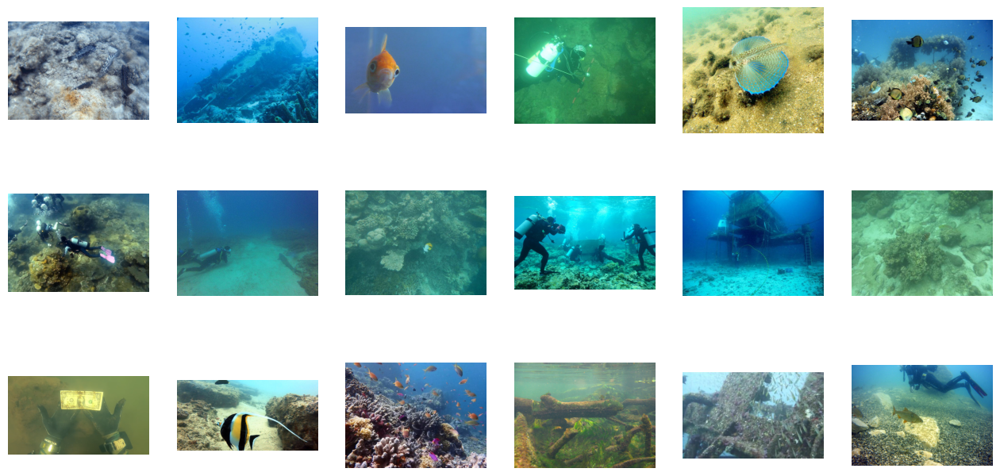

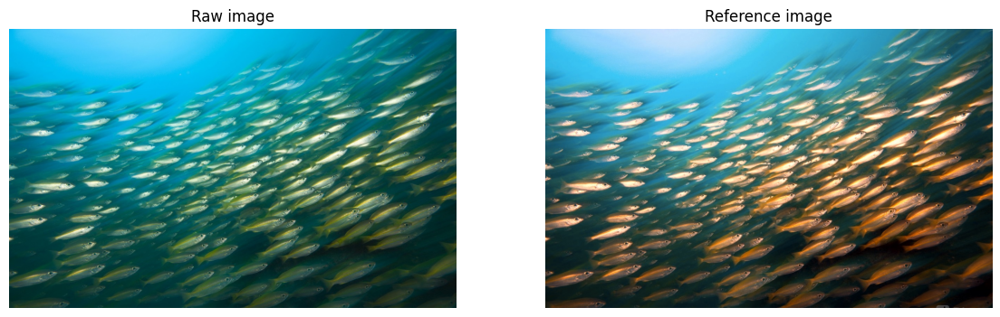

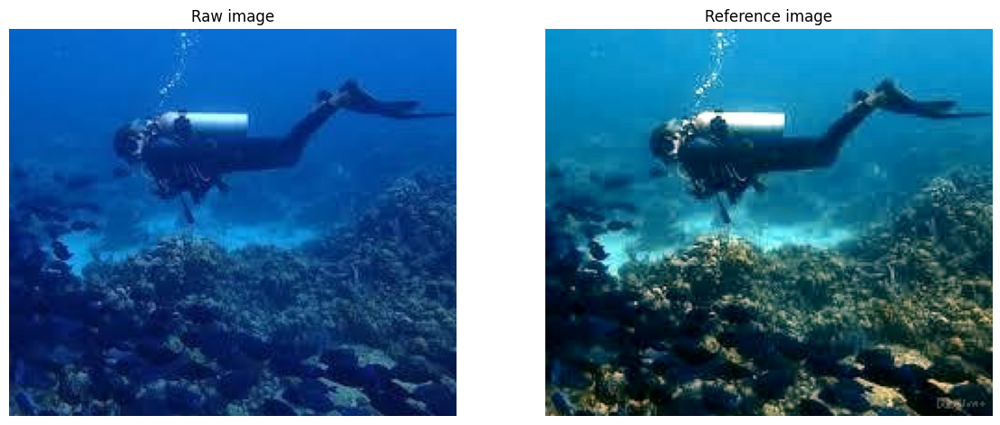

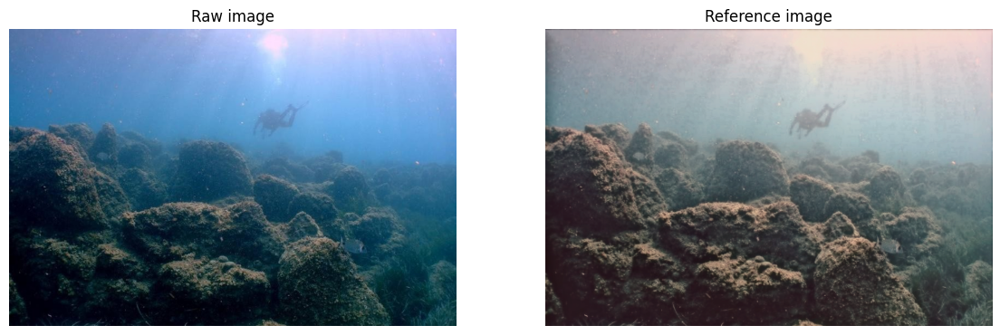

In [9]:
show_image_grid(image_path=images_raw, grid_size=(3, 6), image_size=(16, 8))


for i in range(1, 4):
    raw_img, ref_img = sample_images()
    compare_images([raw_img, ref_img], ["Raw image", "Reference image"], (14, 14))
plt.show()

Existing approaches used to address the problem of Underwater Image Enhancement present some **limitations**:

* Given the complexity of the underwater environment, a single image processing method is not able to adapt to different scenes (such as different turbidities, different lighting conditions, and shots from different angles), causing inconsistency in performance (imprecise or incorrect improvements).

* Models based on Deep Learning methods, which are usually structured with an end-to-end network, apply processing that is effectively a black box, reducing the model's explainability and preventing insights for improvement.

* Training a deep network requires a large number of training data pairs, consisting of a raw image and a reference image, considered the ground truth and obtained through selection made by expert users, since it is not possible to have a true ground truth image. The reference image for such models acts as an upper limit for the quality of the image obtained from the raw image, preventing the generation of better images.

Reinforcement Learning presents itself as an effective method to overcome these limitations. It indeed provides a strategy to organize an optimal sequence of actions that exploit basic image enhancement methods to achieve the goal of effective overall image improvement, as can be seen in the figure below. Each action in the optimal sequence consists of a specific image processing technique so that the entire sequence of actions is transparent.

Furthermore, the possibility of performing both exploration and exploitation could allow for obtaining images of better quality compared to the reference image.

The model solves a Markov Decision Process (MDP) that consists of the interaction at each step $t$ between an **agent** and an **environment**. The MDP is composed of four components:

* a **state** $s_t \in S$ which consists of the set of information that the agent perceives from the environment: in our case, the state is made up of features extracted from the environment's images.
* an **action** $a_t \in A$ which consists of any behavior that the agent can perform in the environment: in our case, it involves image enhancement operations.
* a **reward** $r_t \in R$ which is feedback that the agent receives from the environment after performing an action: in our case, the reward defines how much the action produces a result closer to the ground truth image compared to the starting image.
* a **policy** $\Omega_\theta$ which is the strategy that the agent applies to decide what its next action will be based on the current state it is in.

## **General Framework**


The general framework used is composed of four parts:

1. **Feature Extraction Module**: extracts features from an image. The extracted features will constitute the states.
2. **Deep Q-Network**: takes a state as input and returns a $Q(s,a)$ value for each action.
3. **Action Selection Module**: chooses an action using an ϵ-greedy policy.
4. **Reward Calculation** in terms of image improvement. This part is present only during training.

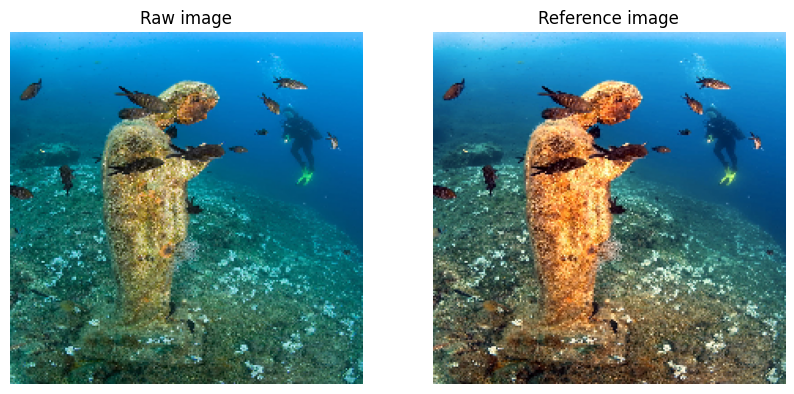

In [10]:
random_image, random_reference = sample_images(target_size=(224, 224))
compare_images(
    [random_image, random_reference], ["Raw image", "Reference image"], (10, 10)
)

### Actions


As actions, **image enhancement** techniques are used. Below are the four categories of techniques employed, each followed by a detailed list of the specific techniques belonging to that category:

**Basic Adjustments**
1. Brightness +5%
2. Brightness -5%
3. Contrast +5%
4. Contrast -5%
5. Color Saturation +5%
6. Color Saturation -5%

**Color Adjustments**
7. Red +5%
8. Red -5%
9. Green +5%
10. Green -5%
11. Blue +5%
12. Blue -5%

**Corrections**
13. Gamma Transformation +
14. Gamma Transformation -
15. HE
16. CLAHE
17. White Balance

**Deblurring**
18. Sharpen
19. Emboss
20. DCP

Less intuitive actions are described in the following subsections.

`apply_action` is a function that allows applying an action on an image and returns the improved image as a result.
  * `action_code` is the code of the action to apply
  * `img` is the image on which to apply the selected action


In [11]:
actions_number = 20  # Total number of image manipulation actions available

# Initialize image augmentation sequences using imgaug library
seq_sharpen = iaa.Sequential([iaa.Sharpen(alpha=0.05)])  # Sequence to sharpen images
seq_emboss = iaa.Sequential([iaa.Emboss(alpha=0.05)])  # Sequence to emboss images


def apply_action(action_code, img):
    """
    Apply a specific image manipulation action based on the action code.

    Args:
    action_code (int): The code representing the specific action to apply.
    img (Image): The image to which the action will be applied.

    Returns:
    Image: The modified image after applying the action.
    """
    if action_code in [0, 1]:
        # Adjust brightness
        factor = 1.05 if action_code == 0 else 0.95
        converter = ImageEnhance.Brightness(img)
        return converter.enhance(factor)

    elif action_code in [2, 3]:
        # Adjust contrast
        factor = 1.05 if action_code == 2 else 0.95
        converter = ImageEnhance.Contrast(img)
        return converter.enhance(factor)

    elif action_code in [4, 5]:
        # Adjust color saturation
        factor = 1.05 if action_code == 4 else 0.95
        converter = ImageEnhance.Color(img)
        return converter.enhance(factor)

    elif action_code in [6, 7, 8, 9, 10, 11]:
        # Adjust RGB channels individually
        factor = 1.05 if action_code in [6, 8, 10] else 0.95
        red, green, blue = img.split()

        if action_code in [6, 7]:
            red = red.point(lambda i: i * factor)
        elif action_code in [8, 9]:
            green = green.point(lambda i: i * factor)
        else:
            blue = blue.point(lambda i: i * factor)

        return Image.merge("RGB", (red, green, blue))

    else:
        img_array = np.array(img)

        if action_code in [12, 13]:
            # Apply gamma correction
            gamma = 1.5 if action_code == 12 else 0.5
            return gammaCorrection(img_array, gamma)

        elif action_code in [14, 15, 16]:
            # Apply histogram equalization techniques
            opencv_image = cv.cvtColor(img_array, cv.COLOR_RGB2BGR)
            if action_code == 14:
                return heq(opencv_image)
            elif action_code == 15:
                return claheq(opencv_image)
            else:
                return white_balance(opencv_image)

        elif action_code in [17, 18]:
            # Apply predefined imgaug sequences
            img_array = np.expand_dims(img_array, axis=0)
            if action_code == 17:
                modified_array = seq_sharpen(images=img_array)
            else:
                modified_array = seq_emboss(images=img_array)
            return Image.fromarray(modified_array[0])

        elif action_code == 19:
            # Apply dehazing technique
            opencv_image = cv.cvtColor(img_array, cv.COLOR_RGB2BGR)
            return dehaze(opencv_image, refine=False)

        else:
            print("unsupported action", action_code)
            return img

## White balance enhancement

In [12]:
def white_balance(opencv_image):
    """
    Perform white balance on an image using the LAB color space.

    This function adjusts the color balance of an image by modifying the 'a' and 'b' channels
    in the LAB color space to reduce color casts. The adjustment is based on the deviation of
    the average 'a' and 'b' values from a neutral value (128), scaled and applied inversely
    across the luminance of the image.

    Args:
    opencv_image (numpy.ndarray): The input image in BGR format.

    Returns:
    PIL.Image: The white-balanced image in RGB format.
    """
    # Convert BGR image to LAB color space
    result = cv.cvtColor(opencv_image, cv.COLOR_BGR2LAB)

    # Calculate the average 'a' and 'b' values across the image
    avg_a = np.average(result[:, :, 1])
    avg_b = np.average(result[:, :, 2])

    # Adjust 'a' and 'b' channels based on their deviation from neutral value
    result[:, :, 1] -= (avg_a - 128) * (result[:, :, 0] / 255.0) * 1.1
    result[:, :, 2] -= (avg_b - 128) * (result[:, :, 0] / 255.0) * 1.1

    # Convert adjusted LAB image back to RGB color space
    resultPil = cv.cvtColor(result, cv.COLOR_LAB2RGB)

    # Convert the result to a PIL Image and return
    pil_image = Image.fromarray(resultPil)
    return pil_image

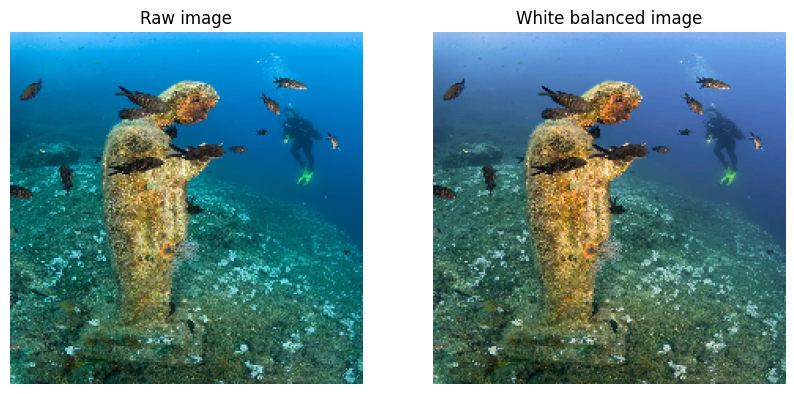

In [13]:
white_balanced_opencv = apply_action(action_code=16, img=random_image)

compare_images(
    [random_image, white_balanced_opencv],
    ["Raw image", "White balanced image"],
    (10, 10),
)

#### Dark Channel Prior (DCP)

This technique, which is usually used for haze removal in outdoor scene images, has also been widely used for the recovery of underwater images.

For more information on DCP, refer to paper [3] in the *Literature References* section.

* It is implemented in the **dehaze()** function.

* The guided_filter() function is additional, and is used to refine the image obtained from dehaze(), which can sometimes be a bit grainy.


In [14]:
# Constants for indexing color channels
R, G, B = 0, 1, 2


def boxfilter(I, r):
    """
    Apply a box filter to the input image I with radius r.

    Args:
    I (numpy.ndarray): Input image array.
    r (int): Radius of the box filter.

    Returns:
    numpy.ndarray: The filtered image.
    """
    M, N = I.shape
    dest = np.zeros((M, N))

    # Cumulative sum over Y axis
    sumY = np.cumsum(I, axis=0)

    # Vertical cumulative sum
    dest[: r + 1] = sumY[r : 2 * r + 1]
    dest[r + 1 : M - r] = sumY[2 * r + 1 :] - sumY[: M - 2 * r - 1]
    dest[-r:] = np.tile(sumY[-1], (r, 1)) - sumY[M - 2 * r - 1 : M - r - 1]

    # Cumulative sum over X axis
    sumX = np.cumsum(dest, axis=1)

    # Horizontal cumulative sum
    dest[:, : r + 1] = sumX[:, r : 2 * r + 1]
    dest[:, r + 1 : N - r] = sumX[:, 2 * r + 1 :] - sumX[:, : N - 2 * r - 1]
    dest[:, -r:] = (
        np.tile(sumX[:, -1][:, None], (1, r)) - sumX[:, N - 2 * r - 1 : N - r - 1]
    )
    return dest


def guided_filter(I, p, r=40, eps=1e-3):
    """
    Perform a guided filter on the image I using the guidance image p.

    Args:
    I (numpy.ndarray): Input image array.
    p (numpy.ndarray): Guidance image array.
    r (int): Radius of the guided filter.
    eps (float): Regularization parameter to avoid division by zero.

    Returns:
    numpy.ndarray: The filtered image.
    """
    M, N = p.shape
    base = boxfilter(np.ones((M, N)), r)

    # Calculate means using the box filter
    means = [boxfilter(I[:, :, i], r) / base for i in range(3)]
    mean_p = boxfilter(p, r) / base

    # Calculate means of products
    means_IP = [boxfilter(I[:, :, i] * p, r) / base for i in range(3)]
    covIP = [means_IP[i] - means[i] * mean_p for i in range(3)]

    # Calculate variances
    var = defaultdict(dict)
    for i, j in combinations_with_replacement(range(3), 2):
        var[i][j] = boxfilter(I[:, :, i] * I[:, :, j], r) / base - means[i] * means[j]

    # Calculate the coefficients a
    a = np.zeros((M, N, 3))
    for y, x in np.ndindex(M, N):
        Sigma = np.array(
            [
                [var[R][R][y, x], var[R][G][y, x], var[R][B][y, x]],
                [var[R][G][y, x], var[G][G][y, x], var[G][B][y, x]],
                [var[R][B][y, x], var[G][B][y, x], var[B][B][y, x]],
            ]
        )
        cov = np.array([c[y, x] for c in covIP])
        a[y, x] = np.dot(cov, np.linalg.inv(Sigma + eps * np.eye(3)))

    # Calculate the output image
    b = mean_p - a[:, :, R] * means[R] - a[:, :, G] * means[G] - a[:, :, B] * means[B]
    q = (
        boxfilter(a[:, :, R], r) * I[:, :, R]
        + boxfilter(a[:, :, G], r) * I[:, :, G]
        + boxfilter(a[:, :, B], r) * I[:, :, B]
        + boxfilter(b, r)
    ) / base
    return q

**dehaze()**

In computer vision, the formation of a blurred image is usually described by the following model:

$$\mathbf{I}(\mathbf{x}) = \mathbf{J}(\mathbf{x})t(\mathbf{x}) + \mathbf{A}(1 - t(\mathbf{x}))$$

where $I(x)$ is the observed blurred image, $J(x)$ is the scene brightness ("the clean image") to be recovered, $A$ is the global atmospheric light, and $t$ is the medium transmission.

In [3] He proposed a method to reduce haze from outdoor images. Given an image $J$, its dark channel is calculated as:

$$
J^{dark}(\mathbf{x}) = min_{c \in \{r,g,b\}}( min_{\mathbf{y} \in \Omega(\mathbf{x})}(J^c(\mathbf{y})))
$$

$J$ is an outdoor image without haze, the intensity of $J^{dark}$ in the image region where the sky is not included is close to 0.

The idea is formed from the assumption that there are many dark areas in images where there is no sky whose pixels will have at least one color channel with a very low value.

Thus, the transmission can be estimated as:

$$
\tilde{t}(\mathbf{x}) = 1 - \omega min_{c}( min_{\mathbf{y} \in \Omega(\mathbf{x})}(\frac{I^c(\mathbf{y})}{A^c}))
$$

where $\omega \in (0, 1]$ is a constant to maintain a certain amount of haze to keep the result as natural as possible. Here $min_{c}( min_{\mathbf{y} \in \Omega(\mathbf{x})}(\frac{I^c(\mathbf{y})}{A^c}))$ is the dark channel of the haze-normalized image $\frac{I^c(\mathbf{y})}{A^c}$.

To obtain $A$ from the input image, the p% brightest pixels in the dark channel must first be selected, then, for each color channel, the one with the highest intensity in the input image ${I}$ is chosen as its atmospheric light.

Once $\tilde{t}(\mathbf{x})$, ${A}$, and ${I}$ are obtained, the haze-free image can be calculated with the following formula:

$$
\mathbf{J}(\mathbf{x}) = \frac{\mathbf{I}(\mathbf{x}) - \mathbf{A}}{max(\tilde{t}(\mathbf{x}),t_0)} + \mathbf{A}
$$

where $t_0$ is a lower limit for $t$ to preserve a certain amount of haze in areas where it is denser.


In [15]:
class Node(object):
    """
    A class representing a node with coordinates and a value.

    Attributes:
        x (int): The x-coordinate of the node.
        y (int): The y-coordinate of the node.
        value (int): The value associated with the node.
    """

    def __init__(self, x, y, value):
        self.x = x
        self.y = y
        self.value = value

    def printInfo(self):
        """Prints the information of the node."""
        print(f"{self.x}:{self.y}:{self.value}")


def getMinChannel(img):
    """
    Extracts the minimum color channel across the color channels of an image.

    Args:
        img (numpy.ndarray): A 3D numpy array representing a color image.

    Returns:
        numpy.ndarray: A 2D array representing the minimum channel of the input image.
    """
    if len(img.shape) == 3 and img.shape[2] == 3:
        pass
    else:
        print("Bad image shape, input must be a color image.")
        return None

    return np.min(img, axis=2)


def getDarkChannel(img, blockSize=3):
    """
    Computes the dark channel of an image using a given block size.

    Args:
        img (numpy.ndarray): A 2D numpy array representing an image.
        blockSize (int): The size of the block to use in computing the dark channel.

    Returns:
        numpy.ndarray: A 2D array representing the dark channel of the input image.
    """
    if len(img.shape) != 2:
        print("Bad image shape, input image must be two dimensions.")
        return None

    if blockSize % 2 == 0 or blockSize < 3:
        print("Block size must be odd and not less than 3.")
        return None

    A = (blockSize - 1) // 2
    H, W = img.shape[0] + blockSize - 1, img.shape[1] + blockSize - 1
    imgMiddle = 255 * np.ones((H, W))
    imgMiddle[A : H - A, A : W - A] = img

    imgDark = np.zeros_like(img, np.uint8)
    for i in range(A, H - A):
        for j in range(A, W - A):
            imgDark[i - A, j - A] = np.min(
                imgMiddle[i - A : i + A + 1, j - A : j + A + 1]
            )

    return imgDark


def getAtomsphericLight(darkChannel, img, meanMode=False, percent=0.001):
    """
    Estimates the atmospheric light in an image using its dark channel.

    Args:
        darkChannel (numpy.ndarray): The dark channel of the image.
        img (numpy.ndarray): The original image.
        meanMode (bool): If True, use mean to estimate atmospheric light; otherwise, use max.
        percent (float): The percentage of the brightest pixels in the dark channel to consider.

    Returns:
        int: The estimated atmospheric light.
    """
    size = darkChannel.size
    height, width = darkChannel.shape
    nodes = [Node(i, j, darkChannel[i, j]) for i in range(height) for j in range(width)]
    nodes.sort(key=lambda node: node.value, reverse=True)

    atomsphericLight = 0
    if int(percent * size) == 0:
        atomsphericLight = max(img[nodes[0].x, nodes[0].y])
        return atomsphericLight

    if meanMode:
        sum_light = sum(
            img[node.x, node.y].sum() for node in nodes[: int(percent * size)]
        )
        atomsphericLight = int(sum_light / (int(percent * size) * 3))
    else:
        atomsphericLight = max(
            img[node.x, node.y].max() for node in nodes[: int(percent * size)]
        )

    return atomsphericLight


def dehaze(
    img, omega=0.95, t0=0.1, blockSize=15, meanMode=False, percent=0.001, refine=True
):
    """
    Performs image dehazing using the dark channel prior method.

    Args:
        img (numpy.ndarray): The input hazy image.
        omega (float): The amount of haze to be removed.
        t0 (float): The lower bound for transmission.
        blockSize (int): The size of the block for computing the dark channel.
        meanMode (bool): Determines the method to estimate atmospheric light.
        percent (float): The percentage of the brightest pixels used to estimate light.
        refine (bool): If True, refine the estimated transmission using guided filtering.

    Returns:
        PIL.Image: The dehazed image.
    """
    imgGray = getMinChannel(img)
    imgDark = getDarkChannel(imgGray, blockSize=blockSize)
    atomsphericLight = getAtomsphericLight(
        imgDark, img, meanMode=meanMode, percent=percent
    )

    imgDark = np.float64(imgDark)
    transmission = 1 - omega * imgDark / atomsphericLight
    transmission[transmission < t0] = t0

    if refine:
        normI = (img - img.min()) / (img.max() - img.min())
        transmission = guided_filter(normI, transmission, r=40, eps=1e-3)

    sceneRadiance = np.zeros(img.shape)
    img = np.float64(img)
    for i in range(3):
        SR = (img[:, :, i] - atomsphericLight) / transmission + atomsphericLight
        SR[SR > 255] = 255
        SR[SR < 0] = 0
        sceneRadiance[:, :, i] = SR

    sceneRadiance = np.uint8(sceneRadiance)
    resultPil = cv.cvtColor(sceneRadiance, cv.COLOR_BGR2RGB)
    return Image.fromarray(resultPil)

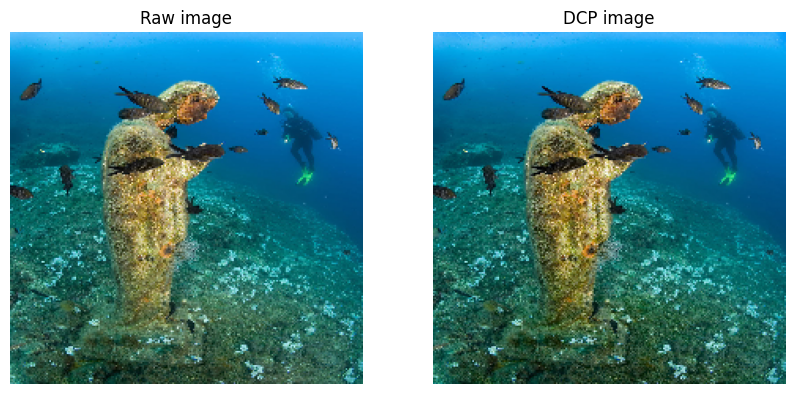

In [16]:
dcp_opencv = apply_action(action_code=19, img=random_image)

compare_images([random_image, dcp_opencv], ["Raw image", "DCP image"], (10, 10))

## Gamma Correction

In [17]:
def gammaCorrection(opencv_image, gamma):
    """
    Apply gamma correction to an image using a specified gamma value.

    Gamma correction is a nonlinear operation used to encode and decode luminance or tristimulus values in video or still image systems.
    This function adjusts the brightness using the gamma value provided.

    Args:
        opencv_image (numpy.ndarray): The input image in OpenCV format.
        gamma (float): The gamma correction value. A gamma value < 1 will make the image appear lighter,
                       and a gamma value > 1 will make the image appear darker.

    Returns:
        PIL.Image: The gamma-corrected image.
    """
    # Calculate the inverse of gamma
    invGamma = 1.0 / gamma

    # Create a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
    table = np.array(
        [((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]
    ).astype("uint8")

    # Apply the gamma correction using the lookup table
    correctedArray = cv.LUT(opencv_image, table)

    # Convert the corrected array to a PIL image and return
    return Image.fromarray(correctedArray)

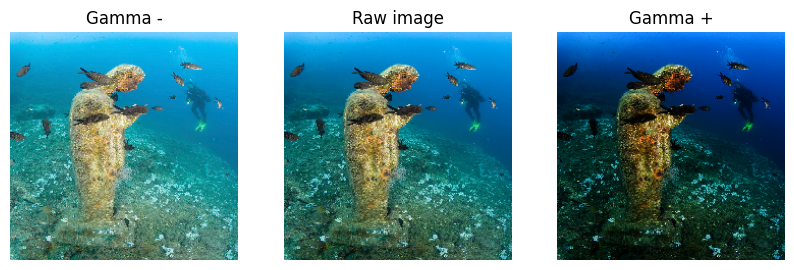

In [18]:
image_1 = apply_action(action_code=12, img=random_image)
image_2 = apply_action(action_code=13, img=random_image)

compare_images(
    [image_1, random_image, image_2], ["Gamma -", "Raw image", "Gamma +"], (10, 10)
)

#### Histogram Equalization and Contrast Limited Adaptive Histogram Equalization (HE and CLAHE) 




The **histogram** is a graphical representation of the tonal distribution of an image: the x-axis shows the tone variation, while the y-axis shows the number of pixels corresponding to that tone.

Typically, the intensity values of images are very close to each other. **Histogram Equalization** is an image processing method that allows for contrast calibration using the image's histogram by distributing the most frequent intensity values more evenly.

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/7/71/Histogrammspreizung.png" width="500"/>
</div>

Standard HE amplifies the contrast in the vicinity of constant areas, which can lead to the amplification of noise in these areas. **Contrast Limited Adaptive Histogram Equalization** introduces a limit to contrast amplification to reduce this problem.


In [19]:
def heq(opencv_image):
    """
    Perform histogram equalization on an image to improve its contrast.

    This function converts an OpenCV BGR image to the YUV color space, applies histogram equalization to the Y channel,
    and then converts it back to RGB format as a PIL image. Histogram equalization enhances the contrast of the image
    by effectively spreading out the most frequent intensity values.

    Args:
        opencv_image (numpy.ndarray): The input image in OpenCV BGR format.

    Returns:
        PIL.Image: The histogram-equalized image in RGB format.
    """
    # Convert the image from BGR to YUV color space
    img_to_yuv = cv.cvtColor(opencv_image, cv.COLOR_BGR2YUV)
    # Apply histogram equalization to the Y channel
    img_to_yuv[:, :, 0] = cv.equalizeHist(img_to_yuv[:, :, 0])
    # Convert the YUV image back to BGR color space
    hist_equalization_result = cv.cvtColor(img_to_yuv, cv.COLOR_YUV2BGR)
    # Convert the BGR image to RGB color space
    resultPil = cv.cvtColor(hist_equalization_result, cv.COLOR_BGR2RGB)
    # Convert the numpy array (OpenCV image) to a PIL image
    pil_image = Image.fromarray(resultPil)
    return pil_image

In [20]:
def claheq(opencv_image):
    """
    Apply Contrast Limited Adaptive Histogram Equalization (CLAHE) to an image.

    This function enhances the local contrast of an image by converting it from BGR to LAB color space,
    applying CLAHE to the L channel, and then converting it back to RGB format as a PIL image.

    Args:
        opencv_image (numpy.ndarray): The input image in OpenCV BGR format.

    Returns:
        PIL.Image: The image after applying CLAHE, in RGB format.
    """
    # Convert the image from BGR to LAB color space
    img = cv.cvtColor(opencv_image, cv.COLOR_BGR2LAB)
    # Create a CLAHE object with specified clip limit and tile grid size
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
    # Apply CLAHE to the L channel of the LAB image
    img[:, :, 0] = clahe.apply(img[:, :, 0])
    # Convert the LAB image back to BGR color space
    img = cv.cvtColor(img, cv.COLOR_LAB2BGR)
    # Convert the BGR image to RGB color space
    resultPil = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    # Convert the numpy array (OpenCV image) to a PIL image and return
    return Image.fromarray(resultPil)

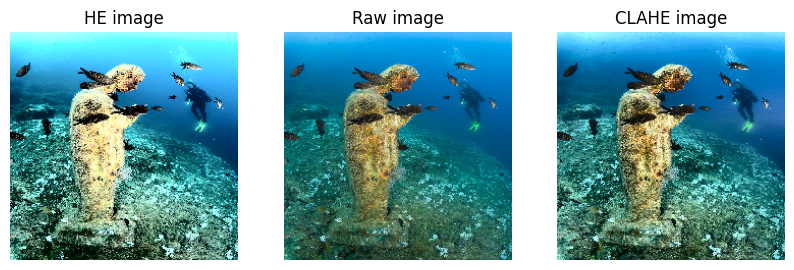

In [21]:
image_1 = apply_action(action_code=14, img=random_image)

image_2 = apply_action(action_code=15, img=random_image)
compare_images(
    [image_1, random_image, image_2], ["HE image", "Raw image", "CLAHE image"], (10, 10)
)

#### Sharpen


The sharpen filter makes the transition from one region of the image to another more obvious


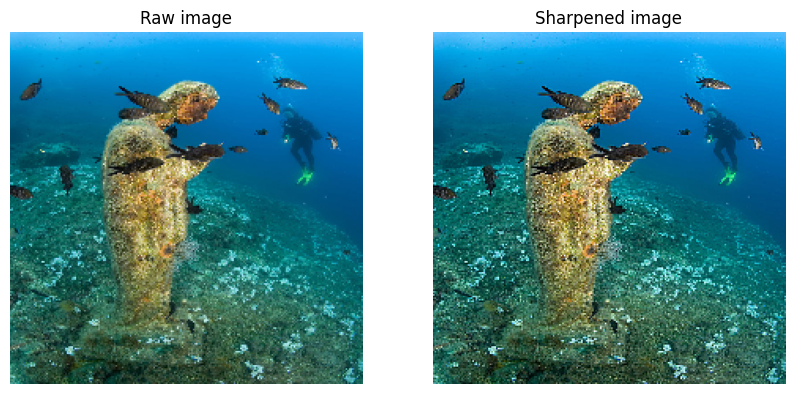

In [22]:
sharpenedImage = apply_action(action_code=17, img=random_image)

compare_images(
    [random_image, sharpenedImage], ["Raw image", "Sharpened image"], (10, 10)
)

#### Emboss

Emboss applies a filter to the image to create a 3D relief cast of it.


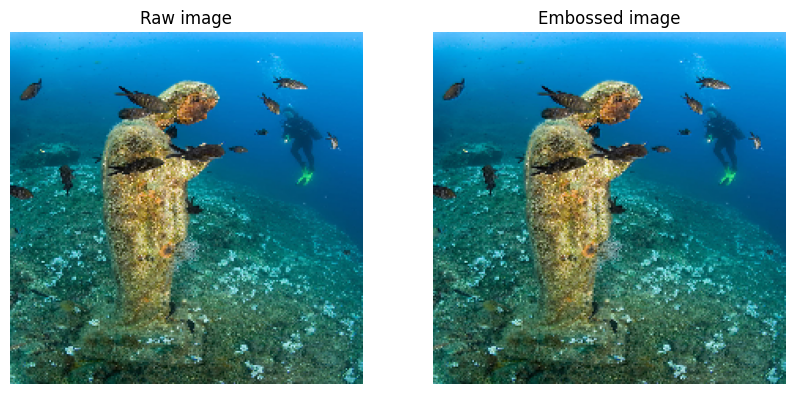

In [23]:
embossedImage = apply_action(action_code=18, img=random_image)

compare_images([random_image, embossedImage], ["Raw image", "Embossed image"], (10, 10))

### States


Individual states are composed of the set of features extracted from the input image. At the moment $t_i$, an action is applied to the starting image, resulting in an "enhanced" image from which features will be extracted to form the state at the moment $t_{i+1}$.


### Feature extraction



Two different types of features are extracted from the image, which will constitute the initial state that will then be perceived by the agent:
* **Colour feature**: global features, describe the properties of the image surface
* **Perceptual feature**: context-dependent features, inspired by human vision.


Ranges for l,a,b:  [0, 254] [66, 157] [70, 202]
Shape: (256, 1)
Shape: (256, 1)
Shape: (256, 1)


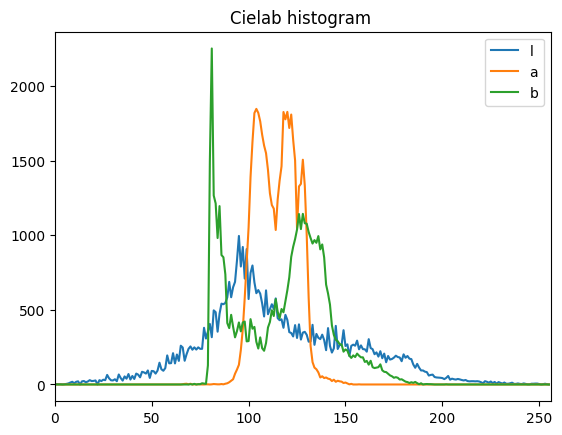

In [24]:
image_array = np.array(random_image)

lab = cv.cvtColor(image_array, cv.COLOR_RGB2LAB)
l_range = [np.min(lab[:, :, 0]), np.max(lab[:, :, 0])]
a_range = [np.min(lab[:, :, 1]), np.max(lab[:, :, 1])]
b_range = [np.min(lab[:, :, 2]), np.max(lab[:, :, 2])]
print("Ranges for l,a,b: ", l_range, a_range, b_range)


bin_count = 256

for i, col in enumerate(["l", "a", "b"]):
    hist = cv.calcHist([lab], [i], None, [bin_count], [0, 256])
    print("Shape:", hist.shape)
    plt.plot(hist, label=col)
    plt.xlim([0, bin_count])

plt.legend()
plt.title("Cielab histogram ")
plt.show()

In [25]:
def get_color_feature(img_array, flatten=False):
    """
    Calculate the color histogram of an image in the LAB color space.

    Args:
    img_array (numpy.ndarray): The input image array.
    flatten (bool): If True, the histogram is flattened before being returned.

    Returns:
    numpy.ndarray: The LAB color histogram of the image. If `flatten` is True,
                   the histogram is returned as a 1D array, otherwise as a 3D array.
    """
    # Convert the image from RGB to LAB color space
    lab = cv.cvtColor(img_array, cv.COLOR_RGB2LAB)

    # Define the channels and bins for the histogram
    channels = [0, 1, 2]
    bins = [20, 20, 20]
    ranges = [0, 256, 0, 256, 0, 256]

    # Calculate the histogram for the LAB image
    histogram = cv.calcHist([lab], channels, None, bins, ranges)

    # Return the histogram, optionally flattened
    if flatten:
        return histogram.flatten()
    else:
        return histogram

In [26]:
image_array = np.array(random_image)
print("color feature are:", get_color_feature(image_array).size)

color feature are: 8000


#### Perceptual feature


Regarding the extraction of perceptual features, a pretrained **VGG-19 convolutional network** is used.

In the following subsections, the model is described, and the VGG-19 is built and compiled, which will be used throughout the rest of the notebook and will be tested on some sample images.

**Why use a pretrained network?**

Lacking a labeled dataset, a model pretrained on the ImageNet dataset was chosen to extract features. Models trained on ImageNet have learned to extract features from a wide variety of images, and should perform well even in the application domain of underwater images.

Keras allows you to instantiate the [**VGG**](https://keras.io/api/applications/vgg/) with the weights of the network pretrained on ImageNet. The `include_top` parameter indicates whether to keep the last dense layers when loading the model or not.


In [27]:
vgg19 = VGG19(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

574710816/574710816 [==============================] - 5s 0us/step


In [28]:
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

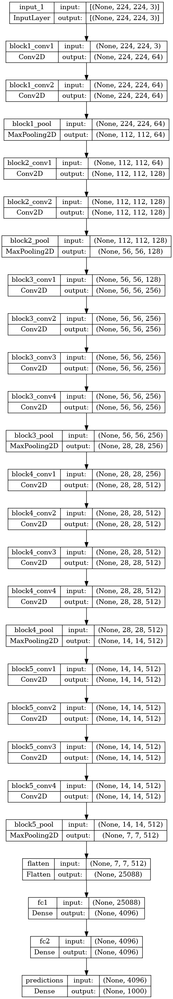

In [29]:
plot_model(vgg19, show_shapes=True)

##### Compile Model


As a final step, the model is compiled choosing:

*   Optimization algorithm: **ADAM**
*   Loss function: **Categorical Cross-Entropy**
*   Model performance evaluation metrics: **Accuracy**


In [30]:
opt = Adam(learning_rate=0.001)

vgg19.compile(optimizer=opt, loss=categorical_crossentropy, metrics=["accuracy"])

##### Feature Extraction


Taking a random image from the dataset, features are extracted by taking the output from one of the fully connected layers, as indicated in the paper. This results in 4096 perceptual features, corresponding to the number of output neurons of the extraction layer.


In [31]:
# Create a model to extract hidden features from the 'fc1' layer of the VGG19 model
hidden_features_vgg = Model(inputs=vgg19.input, outputs=vgg19.get_layer("fc1").output)


def get_perceptual_features(img_array, model=hidden_features_vgg, flatten=False):
    """
    Extract perceptual features from an image using a specified model.

    Args:
    img_array (np.array): The input image array.
    model (tf.keras.Model): The model to use for feature extraction, default is hidden_features_vgg.
    flatten (bool): If True, the output features will be flattened into a 1D array.

    Returns:
    np.array: The extracted features, either flattened or as the original output of the model.
    """
    # Preprocess the image for model prediction
    image_values = np.expand_dims(img_array, axis=0)
    image_values = preprocess_input(image_values)

    # Predict the features using the model
    features = model.predict(image_values, verbose="0")

    # Flatten the features if required
    if flatten:
        return features.flatten()
    else:
        return features


# Extract perceptual features from a random image and print the size of the features
features = get_perceptual_features(random_image)
print("number of perceptual feature: ", features.size)

2024-06-01 00:04:48.550015: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907


number of perceptual feature:  4096


##### Example of feature extraction and classification


In [32]:
for layer in vgg19.layers:

    if "conv" not in layer.name:
        continue

    filters, biases = layer.get_weights()
    print(layer.name, filters.shape)

block1_conv1 (3, 3, 3, 64)
block1_conv2 (3, 3, 64, 64)
block2_conv1 (3, 3, 64, 128)
block2_conv2 (3, 3, 128, 128)
block3_conv1 (3, 3, 128, 256)
block3_conv2 (3, 3, 256, 256)
block3_conv3 (3, 3, 256, 256)
block3_conv4 (3, 3, 256, 256)
block4_conv1 (3, 3, 256, 512)
block4_conv2 (3, 3, 512, 512)
block4_conv3 (3, 3, 512, 512)
block4_conv4 (3, 3, 512, 512)
block5_conv1 (3, 3, 512, 512)
block5_conv2 (3, 3, 512, 512)
block5_conv3 (3, 3, 512, 512)
block5_conv4 (3, 3, 512, 512)


In [33]:
for i in range(len(vgg19.layers)):
    layer = vgg19.layers[i]

    if "conv" not in layer.name:
        continue

    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
10 block3_conv4 (None, 56, 56, 256)
12 block4_conv1 (None, 28, 28, 512)
13 block4_conv2 (None, 28, 28, 512)
14 block4_conv3 (None, 28, 28, 512)
15 block4_conv4 (None, 28, 28, 512)
17 block5_conv1 (None, 14, 14, 512)
18 block5_conv2 (None, 14, 14, 512)
19 block5_conv3 (None, 14, 14, 512)
20 block5_conv4 (None, 14, 14, 512)


A prediction is made and the 5 most probable class memberships are obtained.


35363/35363 [==============================] - 0s 0us/step
The most likely class obtained is: coral_reef (44.64%)


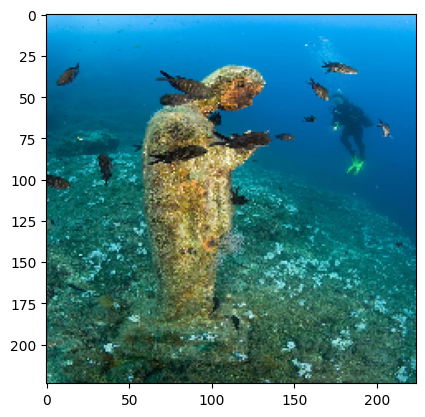

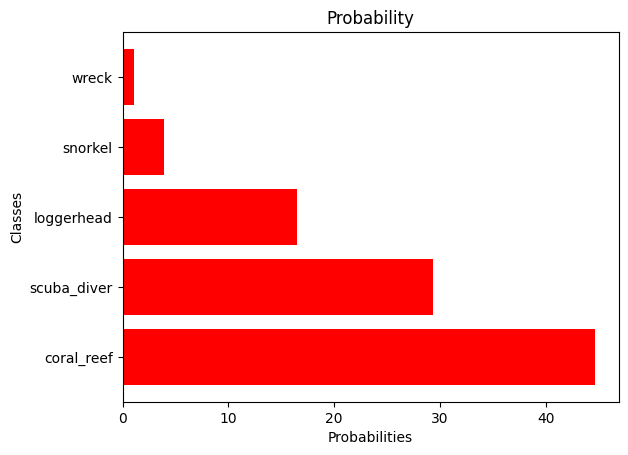

In [34]:
display_image(random_image)

label = decode_predictions(get_perceptual_features(random_image, model=vgg19))


label_most = label[0][0]

print(
    "The most likely class obtained is: %s (%.2f%%)"
    % (label_most[1], label_most[2] * 100)
)

classes = []
probabilities = []
x = 0
while x < len(label[0]):
    classes.append(label[0][x][1])
    probabilities.append(label[0][x][2] * 100)
    x = x + 1

fig, ax = plt.subplots()
width = 0.8
rects1 = ax.barh(classes, probabilities, width, color="r")

ax.set_ylabel("Classes")
ax.set_xlabel("Probabilities")
ax.set_title("Probability")

plt.show()

#### Feature extraction function


When the `extract_features` function receives an image as input, it returns 12096 features (4096 perceptual features and 8000 color features).

The input image must be converted into a 3D tensor of pixels, which will then be expanded from 3 dimensions to 4. The pixel values must then be appropriately scaled for the VGG model.


In [35]:
def get_features(img):
    """
    Extracts and concatenates color and perceptual features from an image.

    This function converts an image into an array and extracts both color and perceptual features.
    These features are then flattened and concatenated to form a single feature vector.

    Args:
    img (PIL.Image or np.array): The image from which features are to be extracted.

    Returns:
    tuple: A tuple containing:
        - features (np.array): The concatenated color and perceptual features.
        - color_features (np.array): The extracted color features.
        - perceptual_features (np.array): The extracted perceptual features.
    """
    img_array = np.array(img)

    color_features = get_color_feature(img_array, flatten=True)
    perceptual_features = get_perceptual_features(img_array, flatten=True)

    features = np.concatenate((color_features, perceptual_features))

    return features, color_features, perceptual_features

In [36]:
features, color_features, perceptual_features = get_features(random_image)
features_number = len(features)

print("number of features: ", features_number)

number of features:  12096


## Reward


The reward is expressed as a function of the improvement of the raw image. This improvement is characterized by two distinct losses: a pixelwise loss and a perceptual loss.

The **pixelwise loss** (Mean Absolute Error) measures the pixel-by-pixel distance between the colors of the ground truth image and the improved image following an action. Minimizing this loss reduces the difference between the color of the ground truth image and that obtained by applying actions on the raw image.

> $L_c=\frac{1}{WH} \sum_{w,h} \lvert Y_{w,h} - G(X(t))_{w,h} \rvert$

* W and H are the width and height of the input image
* X is the input image
* Y is the ground truth image
* G(X) is the image improved following an action

The **pixelwise reward** is defined as the difference in pixelwise losses between the improved image and the raw image.

> $R_c=-[L_c(t)-L_c(t-1)]$

The **perceptual loss** (Mean Squared Error) favors visually pleasing images by measuring the distance between feature vectors (in our case, the vectors of features extracted from the first fully-connected layer of the VGG-19). Minimizing this loss reduces the difference between the high-level features extracted from the ground truth image compared to those extracted from the image obtained by applying actions on the raw image.

> $L_p(t)= \frac{1}{F} \sum_{w,h}(\Phi_{VGG}(Y)_{w,h} -\Phi_{VGG}(G(X(t)))_{w,h})^2$

* $F$: number of perceptual features extracted from the image through the VGG-19
* $\Phi_{VGG}(Y)$: the features extracted from the ground truth image
* $\Phi_{VGG}(G(X(t)))$: the features extracted from the improved image following an action

The **perception reward** is defined as the difference in perceptual losses between the improved image and the raw image.

> $R_p(t)=-[L_p(t)-L_p(t-1)]$

The **reward** is finally defined as:

> $R=\alpha R_c + \beta R_p$

$\alpha$ and $\beta$ are **balancing coefficients** (hyperparameters) that are used to stabilize training and are selected empirically. The recommended values in the literature are $1$ and $0.05$ respectively.


#### Calculation of the pixelwise loss


The function `get_pixelwise_reward` calculates the pixelwise reward according to the aforementioned formula.

* `pre_img_color_features` are the color features of the image before the action is applied
* `post_img_color_features` are the color features of the image obtained after the action is applied
* `ref_img_color_features` are the color features of the reference image

The calculation of the **mean absolute error** is delegated to the [MeanAbsoluteError](https://www.tensorflow.org/api_docs/python/tf/keras/losses/MeanAbsoluteError) function from Keras.


In [37]:
# Initialize the Mean Absolute Error loss function
mae_loss = MeanAbsoluteError()


def get_pixelwise_reward(
    pre_img_color_features, post_img_color_features, ref_img_color_features
):
    """
    Calculate the pixel-wise reward based on the change in mean absolute error (MAE) between pre and post image color features compared to reference image color features.

    Args:
    pre_img_color_features (np.array): Color features of the pre-processed image.
    post_img_color_features (np.array): Color features of the post-processed image.
    ref_img_color_features (np.array): Color features of the reference image.

    Returns:
    float: The difference in MAE between the pre-processed and post-processed images relative to the reference image, serving as a reward signal.
    """
    # Calculate MAE between reference and pre-processed image color features
    pre_ref_mae = mae_loss(ref_img_color_features, pre_img_color_features).numpy()
    # Calculate MAE between reference and post-processed image color features
    post_ref_mae = mae_loss(ref_img_color_features, post_img_color_features).numpy()
    # Return the difference in MAE as the reward
    return pre_ref_mae - post_ref_mae

#### Calculation of the perceptual loss


The function `get_perceptual_reward` calculates the perceptual reward according to the aforementioned formula.

* `pre_img_perc_features` are the perceptual features of the image before the action is applied
* `post_img_perc_features` are the perceptual features of the image obtained after the action is applied
* `ref_img_perc_features` are the perceptual features of the reference image

The calculation of the **mean squared error** is delegated to the [MeanSquaredError](https://www.tensorflow.org/api_docs/python/tf/keras/losses/MeanAbsoluteError) function from Keras.


In [38]:
# Initialize the Mean Squared Error loss function for perceptual reward calculation
mse_loss = MeanSquaredError()


def get_perceptual_reward(
    pre_img_perc_features, post_img_perc_features, ref_img_perc_features
):
    """
    Calculate the perceptual reward based on the change in mean squared error (MSE) between pre and post image perceptual features compared to reference image perceptual features.

    Args:
        pre_img_perc_features (np.array): Perceptual features of the pre-processed image.
        post_img_perc_features (np.array): Perceptual features of the post-processed image.
        ref_img_perc_features (np.array): Perceptual features of the reference image.

    Returns:
        float: The difference in MSE between the pre-processed and post-processed images relative to the reference image, serving as a reward signal.
    """
    # Calculate MSE between reference and pre-processed image perceptual features
    pre_ref_mse = mse_loss(ref_img_perc_features, pre_img_perc_features).numpy()
    # Calculate MSE between reference and post-processed image perceptual features
    post_ref_mse = mse_loss(ref_img_perc_features, post_img_perc_features).numpy()
    # Return the difference in MSE as the reward
    return pre_ref_mse - post_ref_mse

#### Reward Calculation


The function `get_reward` calculates the reward related to a specific improvement on an image. In our case, the improvement corresponds to the application of an action.

* `pre_img_color_feats` and `pre_img_perc_feats` are the features of the image on which the action will be applied

* `post_img_color_feats` and `post_img_perc_feats` are the features of the image obtained after the action is applied

* `ref_img_color_feats` and `ref_img_perc_feats` are the features of the reference image

It has been decided to directly require the features as input to calculate the reward to avoid re-extracting them at every call of `get_reward`, thus improving performance.

The losses measure the distance between the features of the ground truth image and those of the selected image (whether it is the image before or after the action). The rewards, on the other hand, measure the difference between the loss of the post-improvement image and the loss of the pre-improvement image, so positive reward values indicate that the post-improvement image is more similar to the reference image than the pre-improvement image.

The **trend of the reward curve** of each episode of effective training must therefore be **increasing**, indicating that the network learns to choose actions that lead to high rewards and thus bring the starting image closer to the reference image.


In [39]:
# Constants for reward calculation
alpha = 1  # Weight for the pixelwise reward component
beta = 0.05  # Weight for the perceptual reward component


def get_reward(
    pre_img_color_feats,
    pre_img_perc_feats,
    post_img_color_feats,
    post_img_perc_feats,
    ref_img_color_feats,
    ref_img_perc_feats,
):
    """
    Calculate the combined reward for image processing based on pixelwise and perceptual differences.

    This function computes the reward by taking into account the changes in color and perceptual features
    of an image before and after processing, compared to a reference image. The final reward is a weighted
    sum of pixelwise and perceptual rewards.

    Args:
        pre_img_color_feats (np.array): Color features of the pre-processed image.
        pre_img_perc_feats (np.array): Perceptual features of the pre-processed image.
        post_img_color_feats (np.array): Color features of the post-processed image.
        post_img_perc_feats (np.array): Perceptual features of the post-processed image.
        ref_img_color_feats (np.array): Color features of the reference image.
        ref_img_perc_feats (np.array): Perceptual features of the reference image.

    Returns:
        float: The calculated reward as a weighted sum of pixelwise and perceptual rewards.
    """
    # Calculate the pixelwise reward comparing pre and post processing images against the reference
    pixelwise_reward = get_pixelwise_reward(
        pre_img_color_feats, post_img_color_feats, ref_img_color_feats
    )
    # Calculate the perceptual reward comparing pre and post processing images against the reference
    perceptual_reward = get_perceptual_reward(
        pre_img_perc_feats, post_img_perc_feats, ref_img_perc_feats
    )
    # Compute the final reward as a weighted sum of pixelwise and perceptual rewards
    return (alpha * pixelwise_reward) + (beta * perceptual_reward)

In [40]:
f1, cf1, pf1 = get_features(random_image)
fr, cfr, pfr = get_features(random_reference)
print(get_reward(cf1, pf1, cf1, pf1, cfr, pfr))
print(get_reward(cf1, pf1, cfr, pfr, cfr, pfr))

0.0
6.2758441925048825


### Environment Definition


The environment consists of underwater images. Specifically, the environment at each step consists of the raw/enhanced image and the reference image, considered the ground truth.

To define the environment, the Gym's Env class was used, focusing on the implementation of two functions:

* **step**: Performs a step in the environment by applying an action. It returns the new state and the new reward, calculated within this function.
* **reset**: Returns the environment to its initial state, called at the end of each episode.

The environment keeps track of the features of the images it exposes: this choice was made to reduce the temporal duration of training episodes, as it will not be necessary to re-extract the features at each reward calculation, but it will be enough to extract new features after applying an action to the image, while the others will already be stored in the environment.

The functions defined in the Environment class, which implements the environment, are as follows:

* `__init__` initializes the environment

* `step` performs an action on the current image and returns the features extracted from the new image (which correspond to the new state) and the reward associated with the action performed
  * `action`: index of the action to be performed

* `reset` sets a new raw image and its relative ground truth and returns the initial new state (the features extracted from the raw image)
  * `raw_path` and `ref_path` enable a deterministic reset allowing to select the image to load into the env. They are used to iterate over the images of the validation set during validation and the test set during testing

* `render` allows to display the three images of the environment


In [41]:
class Environment(Env):
    """
    A custom environment class that inherits from the base Env class, designed to simulate
    image enhancement processes and evaluate them against a reference image.
    """

    def __init__(self):
        """
        Initializes the Environment with a default image size and resets the environment
        to start with a new pair of raw and reference images.
        """
        super(Environment, self).__init__()
        self.image_size = (224, 224)  # Set the default image size for processing
        self.reset()  # Reset the environment to initial state
        self.saved_score = 0  # Initialize a variable to save scores

    def step(self, action):
        """
        Applies an action to the current image and calculates the reward based on the
        difference between the new image and the reference image.

        Args:
            action (int): An action code that specifies the transformation to apply to the current image.

        Returns:
            tuple: A tuple containing the new current image features and the calculated reward.
        """
        # Apply the specified action to the current image
        new_curr_img = apply_action(action_code=action, img=self.current_image)
        # Extract features from the new current image
        new_curr_img_feats, new_curr_img_col_feats, new_curr_img_perc_feats = (
            get_features(new_curr_img)
        )

        # Calculate the reward for the transformation
        reward = get_reward(
            self.curr_img_col_feats,
            self.curr_img_perc_feats,
            new_curr_img_col_feats,
            new_curr_img_perc_feats,
            self.ref_img_col_feats,
            self.ref_img_perc_feats,
        )

        # Update the current image and its features
        self.current_image = new_curr_img
        self.curr_img_feats = new_curr_img_feats
        self.curr_img_col_feats = new_curr_img_col_feats
        self.curr_img_perc_feats = new_curr_img_perc_feats

        return self.curr_img_feats, reward

    def reset(self, raw_path=None, ref_path=None):
        """
        Resets the environment by loading new raw and reference images either from specified paths or by sampling.

        Args:
            raw_path (str, optional): Path to the raw image file.
            ref_path (str, optional): Path to the reference image file.

        Returns:
            np.array: The features of the current image after reset.
        """
        # Load images from specified paths if provided, otherwise sample new images
        if raw_path is not None and ref_path is not None:
            self.raw_image = load_img(path=raw_path, target_size=self.image_size)
            self.reference_image = load_img(path=ref_path, target_size=self.image_size)
        else:
            self.raw_image, self.reference_image = sample_images(
                target_size=self.image_size
            )

        # Extract features from the loaded or sampled images
        self.raw_img_feats, self.raw_img_col_feats, self.raw_img_perc_feats = (
            get_features(self.raw_image)
        )
        self.ref_img_feats, self.ref_img_col_feats, self.ref_img_perc_feats = (
            get_features(self.reference_image)
        )

        # Set the current image to the raw image and initialize its features
        self.current_image = self.raw_image
        self.curr_img_feats = self.raw_img_feats
        self.curr_img_col_feats = self.raw_img_col_feats
        self.curr_img_perc_feats = self.raw_img_perc_feats
        self.saved_score = 0  # Reset the saved score

        return self.curr_img_feats

    def render(self):
        """
        Renders a comparison between the raw, current, and reference images to visually assess the enhancements.
        """
        compare_images(
            [self.raw_image, self.current_image, self.reference_image],
            ["raw image", "reference image", "enhanced image"],
            (14, 14),
        )

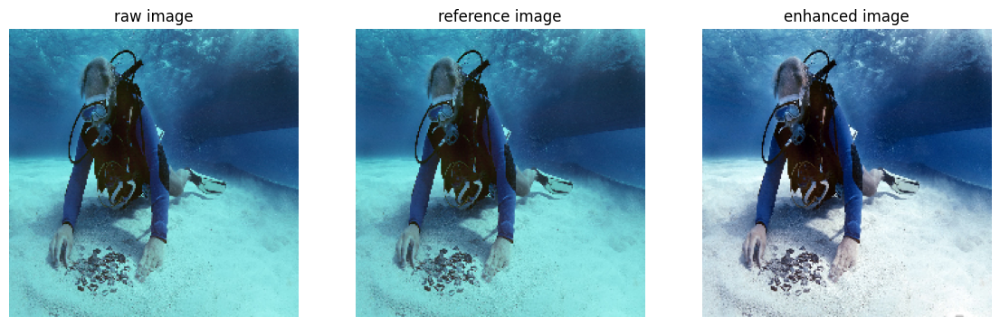

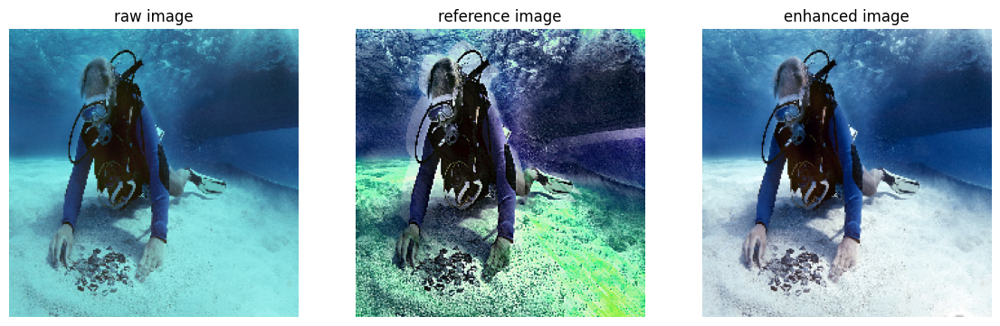

In [ ]:
env = Environment()
env.render()


for i in range(0, 20):
    action_begin_time = time.time()
    img, reward = env.step(i)


env.render()

### Deep Q-Network as an Agent
# 


The DQN is implemented as an agent.
The DQN proposed in the paper is architecturally composed of four fully connected layers: the input is represented by the current state (the image features) and it returns the Q-value for each possible action that the agent could take. There will be as many output neurons as there are actions.

In [43]:
def build_dqn(neuron_in_input_layer, neuron_in_hidden_layers, neuron_in_output_layer):
    """
    Constructs a deep Q-network (DQN) model using the Keras Sequential API.

    Args:
    neuron_in_input_layer (int): Number of neurons in the input layer.
    neuron_in_hidden_layers (tuple): Tuple containing the number of neurons in each hidden layer.
    neuron_in_output_layer (int): Number of neurons in the output layer.

    Returns:
    keras.engine.sequential.Sequential: A compiled neural network model with the specified architecture.
    """
    model = Sequential()

    # Input layer
    model.add(layers.Input(shape=(neuron_in_input_layer,), name="Input"))

    # Hidden layers
    for n in neuron_in_hidden_layers:
        model.add(layers.Dense(n, activation="relu"))

    # Output layer
    model.add(layers.Dense(neuron_in_output_layer, name="Output"))

    return model


# Define the number of neurons in each hidden layer
neuron_in_hidden_layers = (4096, 4096, 512)

#### Model Creation


In [44]:
dqn = build_dqn(features_number, neuron_in_hidden_layers, actions_number)

In [45]:
dqn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              49549312  
                                                                 
 dense_1 (Dense)             (None, 4096)              16781312  
                                                                 
 dense_2 (Dense)             (None, 512)               2097664   
                                                                 
 Output (Dense)              (None, 20)                10260     
                                                                 
Total params: 68438548 (261.07 MB)
Trainable params: 68438548 (261.07 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


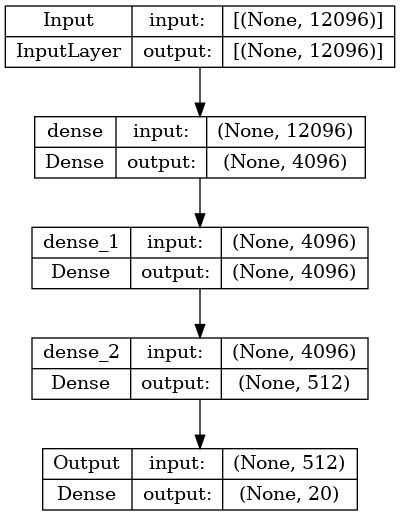

In [46]:
plot_model(dqn, show_shapes=True)

#### Compile model
Model compilation is the final step to configure the model for learning. The important parameters are:

* optimization algorithm: **ADAM**
* loss function: **Mean Squared Error**

Only the evaluation model is compiled because, during the training process, only its weights are updated using the gradient descent algorithm. The weights of the target model are periodically replaced with those of the evaluation model.


In [47]:
opt = Adam(learning_rate=0.001)

dqn.compile(optimizer=opt, loss="mse", metrics=["accuracy"])

### Replay Memory

**Experience replay** allows managing the correlation problem (correlated transitions cause the network to forget what it has not seen for a long time).

* During training, the transitions $(s_t,a_t,r_t,s_{t+1})$ obtained from the evaluation DQN are saved in memory
* The data used by the target DQN to calculate the target value are randomly sampled from the memory

The **Memory** class implements the replay memory and these are the methods it exposes:

* `__init__` initializes the memory by constructing the lists

* `store` adds a transition to the memory
  * `state`, `action`, `reward`, `next_state` are the components of the transition to be stored
  * `done` specifies whether the transition results in a final state or not. A final state is one where the stop condition is met (all calculated Q-values are negative)

* `sample` randomly samples a number of transitions from the memory
  * `batch_size` number of transitions to sample

* `reset` deletes all the transitions saved in memory


In [48]:
class Memory:
    """
    A class used to store transitions collected from interactions with the environment.

    Attributes:
        max_length (int): Maximum number of transitions that can be stored.
    """

    def __init__(self, max_length):
        """
        Initializes the Memory object and sets up storage for transitions.

        Args:
            max_length (int): The maximum number of transitions the memory can hold.
        """
        self.max_length = max_length
        self.reset()

    def store(self, state, action, reward, next_state, done):
        """
        Stores a transition in the memory if there is space available.

        Args:
            state (np.array): The state from which the action was taken.
            action (int): The action taken in the state.
            reward (float): The reward received after taking the action.
            next_state (np.array): The state reached after taking the action.
            done (bool): A boolean flag indicating if the episode ended after this transition.
        """
        if self.stored_transitions < self.max_length:
            self.action_list[self.stored_transitions] = action
            self.state_list[self.stored_transitions] = state
            self.reward_list[self.stored_transitions] = reward
            self.next_state_list[self.stored_transitions] = next_state
            self.done_list[self.stored_transitions] = done
            self.stored_transitions += 1

    def sample(self, batch_size):
        """
        Randomly samples a batch of transitions from memory.

        Args:
            batch_size (int): The number of transitions to sample.

        Returns:
            tuple: A tuple containing batches of states, actions, rewards, next_states, and dones.
        """
        index = sample(range(0, self.stored_transitions), batch_size)

        return (
            self.state_list[index],
            self.action_list[index],
            self.reward_list[index],
            self.next_state_list[index],
            self.done_list[index],
        )

    def reset(self):
        """
        Resets the memory and clears all stored transitions.
        """
        self.state_list = np.zeros((self.max_length, features_number), dtype=np.float32)
        self.action_list = np.zeros(self.max_length, dtype=np.int32)
        self.reward_list = np.zeros(self.max_length, dtype=np.float32)
        self.next_state_list = np.zeros(
            (self.max_length, features_number), dtype=np.float32
        )
        self.done_list = np.zeros((self.max_length), dtype=bool)
        self.stored_transitions = 0

## **Double DQN**

### Goal


Start of Selection
The problem is modeled as a Markov Decision Process (MDP), so the agent's goal becomes to learn the optimal policy that chooses in each state the action with the highest total cumulative reward.

At time $t$, the **cumulative reward** (evaluation of action $a$ on state $s$) is defined as the reward obtained by performing action $a$ in state $s$ plus the maximum reward obtainable in the next move:

> $Q(s_t,a_t) = r(s_t,a_t)+\gamma max(Q(s_{t+1},a_{t+1}))$

* $0 \le \gamma \le 1$ is the **discount rate** and expresses how much to consider the reward of the next action compared to the reward of the current one

The MDP enjoys the **Markov property**, according to which the action $a_t$ at step $t$ is determined solely based on the state $s_t$, regardless of previous states.

The best action $a_t^*$ at step $t$ is therefore the action $a$ that maximizes $Q(s_t,a_t)$ in the following **objective function**:

> $a_t^* = argmax_{a_t(i)} Q(s_t,a_t(i))$

* $i$ is the action index

The goal is for the agent, by continuously interacting with the environment, to learn the optimal sequence of actions to take.
End of Selection


### Training

Start of Selection
Optimizing the objective function requires learning the weights $\omega$ of the agent, so $Q(s,a)$ is rewritten as $Q(s,a;\omega)$ and the training is described with respect to $\omega$.

A Double DQN (DDQN) composed of 2 identical DQNs is used. The use of a second DQN helps stabilize the algorithm by decoupling the action selection from the calculation of its Q-value.

* The **evaluation DQN** selects the action to be performed. It evaluates all possible actions in state $s_{t+1}$ and chooses the action $a_{t+1}(i^*)$ with the highest Q-value (adopting the ϵ-greedy algorithm there is a probability ϵ that the network chooses an action randomly).

> $a_{t+1}(i^*) = argmax_{a_{t+1}(i)} Q(s_{t+1},a_{t+1}(i);\omega)$

* The **target DQN** estimates the Q-value for the action $a_{t+1}(i^*)$ selected by the evaluation DQN and calculates $\hat Q_*(s_t,a_t;\omega^-)$. The weights of the target DQN are denoted by $\omega^-$.

> $\hat Q_*(s_t,a_t;\omega^-) = r_t+\gamma \hat Q(s_{t+1},a_{t+1}(i^*);\omega^-)$ 

The **loss function** for learning $\omega$ is thus defined as the squared difference between the cumulative reward calculated by the target DQN $\hat Q_*(s_t,a_t;\omega^-)$ and that calculated by the evaluation DQN $Q(s_t,a_t;\omega)$:

> $L(\omega) = [\hat Q_*(s_t,a_t;\omega^-) - Q(s_t,a_t;\omega)]^2$

According to the implementation described in the paper, after each mini-batch, ADAM is used to update the $\omega$ weights of the evaluation DQN and to copy these weights to $\omega^-$, thus updating the weights of the target DQN. In the following implementation, it has been decided to take advantage of having two models, so the update operations of the target DQN will be less frequent than those of the evaluation DQN.

In [49]:
class DoubleDeepQNetwork:
    """
    A class representing a Double Deep Q-Network for reinforcement learning.

    Attributes:
        memory (Memory): Memory buffer for storing experiences.
        alpha (float): Initial learning rate for the optimizer.
        gamma (float): Discount factor for future rewards.
        epsilon (float): Exploration rate in the epsilon-greedy policy.
        epsilon_min (float): Minimum exploration rate.
        epsilon_decay_rate (float): Decay rate for exploration rate.
        evaluation_model (Model): The neural network model used for evaluating actions.
        target_model (Model): The neural network model used for calculating target values.
        optimizer (Optimizer): Optimizer used for training the evaluation model.
        loss (list): List to store loss values during training.
        actions_number (int): Number of possible actions.
    """

    def __init__(
        self,
        state_size,
        actions_number,
        memory_length,
        alpha,
        gamma,
        epsilon,
        epsilon_min,
        epsilon_decay_rate,
        alpha_min,
        alpha_decay_step,
        alpha_decay_rate,
    ):
        """
        Initializes the DoubleDeepQNetwork with specified parameters and models.

        Args:
            state_size (int): The size of the input state space.
            actions_number (int): The number of possible actions.
            memory_length (int): The maximum length of the memory buffer.
            alpha (float): Initial learning rate.
            gamma (float): Discount factor for future rewards.
            epsilon (float): Initial exploration rate.
            epsilon_min (float): Minimum exploration rate.
            epsilon_decay_rate (float): Decay rate for exploration rate.
            alpha_min (float): Minimum learning rate.
            alpha_decay_step (int): Number of steps before applying decay to learning rate.
            alpha_decay_rate (float): Rate at which the learning rate decays.
        """
        self.memory = Memory(max_length=memory_length)
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay_rate = epsilon_decay_rate
        self.evaluation_model = build_dqn(
            state_size, neuron_in_hidden_layers, actions_number
        )
        self.target_model = self.evaluation_model

        lr_schedule = keras.optimizers.schedules.ExponentialDecay(
            initial_learning_rate=alpha,
            decay_steps=alpha_decay_step,
            decay_rate=alpha_decay_rate,
        )
        self.optimizer = Adam(learning_rate=lr_schedule)
        self.evaluation_model.compile(
            optimizer=self.optimizer, loss="mse", metrics=["accuracy"]
        )
        self.update_target_from_eval()
        self.loss = []
        self.actions_number = actions_number

    def update_target_from_eval(self):
        """Updates the weights of the target model to match the evaluation model."""
        self.target_model.set_weights(self.evaluation_model.get_weights())

    def select_action(self, state):
        """
        Selects an action using an epsilon-greedy policy.

        Args:
            state (np.array): The current state.

        Returns:
            int: The action selected.
        """
        if np.random.rand() <= self.epsilon:
            action = randrange(self.actions_number)
        else:
            state = np.expand_dims(state, axis=0)
            action_vals = self.evaluation_model.predict(state, verbose="0")
            action = np.argmax(action_vals[0])
        return action

    def check_if_done(self, state):
        """
        Checks if the current state should terminate the episode.

        Args:
            state (np.array): The current state.

        Returns:
            bool: True if the episode should end, False otherwise.
        """
        state = np.expand_dims(state, axis=0)
        action_vals = self.evaluation_model.predict(state, verbose="0")
        if np.max(action_vals[0]) < 0:
            return True
        else:
            return False

    def train(self, batch_size):
        """
        Trains the model on a batch of experiences.

        Args:
            batch_size (int): The number of samples in the batch.
        """
        states, actions, rewards, next_states, dones = self.memory.sample(batch_size)
        eval_q_values = self.evaluation_model.predict(states, verbose="0")
        target_q_values = eval_q_values
        next_eval_q_values = self.evaluation_model.predict(next_states, verbose="0")
        next_target_q_values = self.target_model.predict(next_states, verbose="0")

        for batch_index in range(len(states)):
            best_next_action_index = np.argmax(next_eval_q_values[batch_index])
            if dones[batch_index]:
                target_q_values[batch_index][best_next_action_index] = rewards[
                    batch_index
                ]
            else:
                target_q_values[batch_index][best_next_action_index] = rewards[
                    batch_index
                ] + (
                    self.gamma
                    * next_target_q_values[batch_index][best_next_action_index]
                )
        self.evaluation_model.train_on_batch(states, target_q_values)

    def store(self, state, action, reward, nstate, done):
        """
        Stores a transition in memory.

        Args:
            state (np.array): The current state.
            action (int): The action taken.
            reward (float): The reward received.
            nstate (np.array): The next state after the action.
            done (bool): Whether the episode has ended.
        """
        self.memory.append((state, action, reward, nstate, done))

    def epsilon_decay(self):
        """Applies decay to the epsilon value based on the decay rate until it reaches the minimum value."""
        if self.epsilon > self.epsilon_min:
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay_rate)

## Experiment


### Training Implementation


Below is the implementation of the DDQN training. The training follows these steps:

1. Given a raw image, its features are extracted and these correspond to the initial state $s_0$

2. Using the evaluation DQN, the Q-value for the current state relative to each action is calculated

3. The action with the highest Q-value is applied, resulting in an "enhanced" image

4. If the Q-values obtained for the "enhanced" image are all negative (or the maximum number of steps allowed per episode is reached), the episode ends; otherwise, the iteration continues starting from point 1


In [50]:
learning_rate = 1e-5
min_learning_rate = 1e-8
learning_rate_decade_step = 5000
learning_rate_decay_rate = 0.96
discount_rate = 0.99
batch_size = 32
epsilon = 1
epsilon_min = 0.1
epsilon_decay_rate = 0.9996

episodes = 20_000
actions_number = 20


backup_weights = True

load_weights = False

episode_max_steps = 50
step_per_update_eval_dqn = 10
step_per_update_targ_dqn = episode_max_steps
mem_length = 50_000

ddqn = DoubleDeepQNetwork(
    state_size=features_number,
    actions_number=actions_number,
    memory_length=mem_length,
    alpha=learning_rate,
    gamma=discount_rate,
    epsilon=epsilon,
    epsilon_min=epsilon_min,
    epsilon_decay_rate=epsilon_decay_rate,
    alpha_min=min_learning_rate,
    alpha_decay_step=learning_rate_decade_step,
    alpha_decay_rate=learning_rate_decay_rate,
)

In [51]:
def train_ddqn():
    """
    Train the Double Deep Q-Network (DDQN) model over a specified number of episodes.
    This function handles the training loop, including environment interaction, reward accumulation,
    model training, and periodic updates of the target network from the evaluation network.
    """
    total_step_count = 0
    training_start_time = time.time()
    moving_avg_window_size = 20
    train_rewards = []

    for episode in range(episodes):
        episode_start_time = time.time()
        state = env.reset()
        episode_reward = 0
        done = False
        step_count = 0

        while not done:
            step_count += 1
            total_step_count += 1

            action = ddqn.select_action(state)
            next_state, reward = env.step(action)
            episode_reward += reward
            done = ddqn.check_if_done(next_state)
            ddqn.memory.store(state, action, reward, next_state, done)
            state = next_state

            # Train the evaluation network every 'step_per_update_eval_dqn' steps
            if (
                step_count % step_per_update_eval_dqn == 0
                and ddqn.memory.stored_transitions >= batch_size
            ):
                ddqn.train(batch_size)

            # Update the target network from the evaluation network every 'step_per_update_targ_dqn' steps
            if step_count % step_per_update_targ_dqn == 0:
                ddqn.update_target_from_eval()

            if done or step_count >= episode_max_steps:
                train_rewards.append(episode_reward)

                episode_finish_time = time.time()
                episode_elapsed_time = episode_finish_time - episode_start_time
                training_elapsed_time = episode_finish_time - training_start_time
                moving_avg_reward = mean(train_rewards[-moving_avg_window_size:])
                print(
                    "Episode: {}/{}, steps: {}[{}], Total reward: {}[{:.1f}], time: {:.1f}s[{:.1f}m], e: {}".format(
                        episode + 1,
                        episodes,
                        step_count,
                        total_step_count,
                        episode_reward,
                        moving_avg_reward,
                        episode_elapsed_time,
                        training_elapsed_time / 60,
                        ddqn.epsilon,
                    )
                )
                ddqn.epsilon_decay()

                # Save model weights periodically
                if backup_weights and episode % 1000 == 0:
                    ddqn.evaluation_model.save_weights(
                        "evalDqn-epsiode{}.weights.h5".format(episode)
                    )

                break

    training_finish_time = time.time()
    training_elapsed_time = training_finish_time - training_start_time
    print(
        "training time: {:.1f}m, average episode time: {:.1f}s".format(
            training_elapsed_time / 60, training_elapsed_time / episodes
        )
    )

    plot_training_rewards(train_rewards, moving_avg_window_size)

### Validation

Each training session is followed by a validation phase on a subsection of the dataset that is disjoint from the training set.

The performances on the validation set were recorded and compared to determine which hyperparameter configuration yielded the best results.

The performances were evaluated by calculating an average for each of the three chosen metrics (MSE, PSNR, and SSIM) on each image of the validation set.

* **Mean Squared Error** MSE: obtained by calculating the mean squared error between each pixel of the 2 images. The lower it is, the less the 2 images differ from each other. As a metric, it is very common and simple to calculate:

  > $MSE = \frac{1}{WH} \sum_{w,h} [I_1(w,h)-I_2(w,h)]^2$

  * $W$ and $H$ are the dimensions of the image
  * $I_1$ and $I_2$ are the pixels of the images

  The MSE was calculated using the [mean_squared_error](https://scikit-image.org/docs/stable/api/skimage.metrics.html#skimage.metrics.mean_squared_error) method from Skimage.

* **Peak Signal-to-Noise Ratio** PSNR: an indicator used to measure the quality of a compressed (or reconstructed) image compared to the original. The higher it is, the better the quality of the image. PSNR is also a common and simple metric to calculate:

  > $PSN = 10*log_{10}(\frac{R^2}{MSE})$

  * R is the maximum possible value of the individual pixels of the images (in the case of RGB images it is 255)
  * MSE is the mean squared error between the 2 images

  PSNR was calculated using the [peak_signal_noise_ratio](https://scikit-image.org/docs/stable/api/skimage.metrics.html#skimage.metrics.peak_signal_noise_ratio) method from Skimage

* **Structural Similarity** SSIM: a measure used to evaluate the similarity between two images. Unlike MSE and PSNR, it uses absolute error instead of squared error. The higher the SSIM, the more similar the 2 images are to each other.

  SSIM was calculated using the [structural_similarity](https://scikit-image.org/docs/stable/api/skimage.metrics.html#skimage.metrics.structural_similarity) method from Skimage


starting training


2024-06-01 00:05:09.444755: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f8dc0d3e9d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-01 00:05:09.445001: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2024-06-01 00:05:09.468620: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1717200309.632330     297 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Episode: 1/20000, steps: 50[50], Total reward: -2.0320875465869905[-2.0], time: 8.9s[0.1m], e: 1
Episode: 2/20000, steps: 50[100], Total reward: -6.019483196735384[-4.0], time: 8.4s[0.3m], e: 0.9996
Episode: 3/20000, steps: 50[150], Total reward: -6.732202458381651[-4.9], time: 6.8s[0.4m], e: 0.9992001600000001
Episode: 4/20000, steps: 50[200], Total reward: -0.24145603179931646[-3.8], time: 10.4s[0.6m], e: 0.9988004799360002
Episode: 5/20000, steps: 50[250], Total reward: -3.8359248638153063[-3.8], time: 8.5s[0.7m], e: 0.9984009597440259
Episode: 6/20000, steps: 50[300], Total reward: -2.350940227508544[-3.5], time: 9.2s[0.9m], e: 0.9980015993601283
Episode: 7/20000, steps: 50[350], Total reward: 0.4388157129287719[-3.0], time: 6.9s[1.0m], e: 0.9976023987203844
Episode: 8/20000, steps: 50[400], Total reward: -0.5254341125488273[-2.7], time: 8.6s[1.1m], e: 0.9972033577608963
Episode: 9/20000, steps: 50[450], Total reward: -4.958633846044541[-2.9], time: 10.5s[1.3m], e: 0.99680447641779

/tmp/ipykernel_244/1381872354.py:102: RuntimeWarning: invalid value encountered in divide
  transmission = 1 - omega * imgDark / atomsphericLight
/tmp/ipykernel_244/1381872354.py:120: RuntimeWarning: invalid value encountered in cast
  sceneRadiance = np.uint8(sceneRadiance)


Episode: 235/20000, steps: 50[11750], Total reward: -2.3881383061409[-2.7], time: 7.3s[34.9m], e: 0.910629896479468
Episode: 236/20000, steps: 50[11800], Total reward: -1.8143490910530098[-2.7], time: 7.5s[35.1m], e: 0.9102656445208762
Episode: 237/20000, steps: 50[11850], Total reward: 1.6523947715759282[-2.4], time: 8.0s[35.2m], e: 0.9099015382630679
Episode: 238/20000, steps: 50[11900], Total reward: -0.3609864473342896[-2.1], time: 9.9s[35.4m], e: 0.9095375776477627
Episode: 239/20000, steps: 50[11950], Total reward: -8.730707418918607[-2.6], time: 8.9s[35.5m], e: 0.9091737626167036
Episode: 240/20000, steps: 50[12000], Total reward: -3.223354530334474[-2.5], time: 8.3s[35.6m], e: 0.908810093111657
Episode: 241/20000, steps: 50[12050], Total reward: -5.670651662349698[-2.5], time: 8.1s[35.8m], e: 0.9084465690744123
Episode: 242/20000, steps: 50[12100], Total reward: 1.2683048009872426[-2.5], time: 8.3s[35.9m], e: 0.9080831904467827
Episode: 243/20000, steps: 50[12150], Total reward

2024-06-01 13:52:41.863603: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Episode: 4557/20000, steps: 50[227850], Total reward: -6.5476188898086525[-2.4], time: 8.5s[827.8m], e: 0.16157843683528922
Episode: 4558/20000, steps: 50[227900], Total reward: -0.21226539611816403[-2.2], time: 9.2s[827.9m], e: 0.1615138054605551
Episode: 4559/20000, steps: 50[227950], Total reward: -3.74409589767456[-2.6], time: 9.8s[828.1m], e: 0.1614491999383709
Episode: 4560/20000, steps: 50[228000], Total reward: -7.036609447002411[-2.9], time: 9.7s[828.2m], e: 0.16138462025839556
Episode: 4561/20000, steps: 50[228050], Total reward: -0.3932461023330687[-2.8], time: 9.2s[828.4m], e: 0.1613200664102922
Episode: 4562/20000, steps: 50[228100], Total reward: 0.41333408355712875[-2.7], time: 9.5s[828.6m], e: 0.16125553838372808
Episode: 4563/20000, steps: 50[228150], Total reward: -0.6331627726554866[-2.6], time: 8.9s[828.7m], e: 0.1611910361683746
Episode: 4564/20000, steps: 50[228200], Total reward: -0.828789341449737[-2.4], time: 9.3s[828.9m], e: 0.16112655975390727
Episode: 4565/2

2024-06-02 13:23:17.710478: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Episode: 14320/20000, steps: 1[587987], Total reward: 0.5532322406768799[-0.3], time: 0.3s[2238.2m], e: 0.1
Episode: 14321/20000, steps: 1[587988], Total reward: 0.46688921451568605[-0.3], time: 0.3s[2238.2m], e: 0.1
Episode: 14322/20000, steps: 1[587989], Total reward: 0.8943417072296143[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14323/20000, steps: 1[587990], Total reward: -5.019322115182876[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14324/20000, steps: 1[587991], Total reward: 0.46688921451568605[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14325/20000, steps: 1[587992], Total reward: 0.07774960994720459[-0.1], time: 0.2s[2238.3m], e: 0.1
Episode: 14326/20000, steps: 1[587993], Total reward: 1.5033804595470428[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14327/20000, steps: 1[587994], Total reward: -0.17592577934265136[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14328/20000, steps: 1[587995], Total reward: 0.25989589691162107[-0.1], time: 0.3s[2238.3m], e: 0.1
Episode: 14329/20000, 

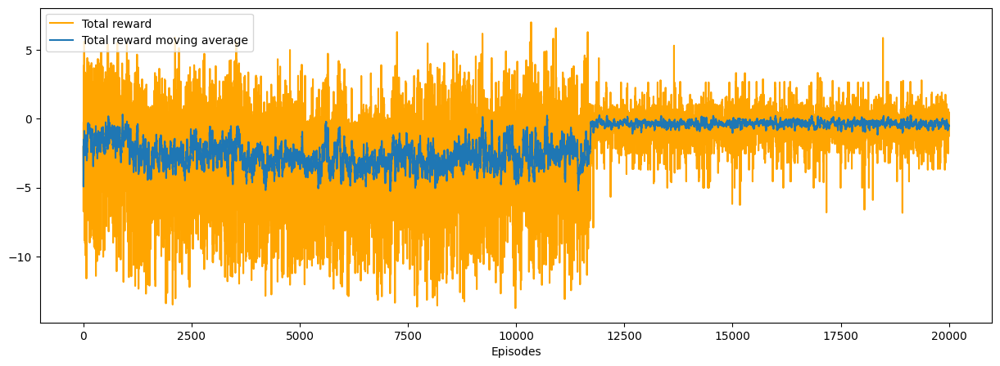

In [52]:
if load_weights:
    print("loading weights from local file")
    local_weights_path = "evalDqn-episode20k.h5"
    ddqn.evaluation_model.load_weights(local_weights_path)
else:
    print("starting training")
    train_ddqn()

## Save final model weights

In [58]:
ddqn.evaluation_model.save_weights("final_model.weights.h5")
print("Final model weights saved.")

Final model weights saved.


## Evaluation

### Qualitative Analysis

In [54]:
if not load_weights:
    total_mse = total_psnr = total_ssim = 0
    ddqn.epsilon = 0

    env.image_size = (224, 224)

    for index, (raw_path, ref_path) in enumerate(zip(images_raw_val, images_ref_val)):
        state = env.reset(raw_path, ref_path)
        tot_rewards = 0
        done = False
        step_count = 1

        while not done:
            action = ddqn.select_action(state)
            new_state, reward = env.step(action)
            done = ddqn.check_if_done(state)
            tot_rewards += reward
            state = new_state

            if done or step_count >= 10:

                mse = mean_squared_error(
                    np.array(env.current_image), np.array(env.reference_image)
                )
                psnr = peak_signal_noise_ratio(
                    np.array(env.current_image), np.array(env.reference_image)
                )
                ssim = structural_similarity(
                    im1=np.array(env.current_image),
                    im2=np.array(env.reference_image),
                    channel_axis=2,
                )
                print(
                    "episode: {}, steps: {}, episode reward: {}, mse: {}, psnr: {}, ssim: {}".format(
                        index, step_count, tot_rewards, mse, psnr, ssim
                    )
                )
                total_mse += mse
                total_psnr += psnr
                total_ssim += ssim
                break
            step_count += 1

    avg_mse = total_mse / len(images_raw_val)
    avg_psnr = total_psnr / len(images_raw_val)
    avg_ssim = total_ssim / len(images_raw_val)

    print(
        "lr: {}, alpha: {}, beta: {}, episode: {} with max steps {}".format(
            learning_rate, alpha, beta, episodes, episode_max_steps
        )
    )
    print("avg mse: {}, avg_psnr: {}, avg ssim: {}".format(avg_mse, avg_psnr, avg_ssim))

episode: 0, steps: 1, episode reward: -0.277278208732605, mse: 500.1235119047619, psnr: 21.14003088702825, ssim: 0.8391636502546013
episode: 1, steps: 1, episode reward: -0.719990873336792, mse: 1465.505161830357, psnr: 16.470930084104175, ssim: 0.8199675879185455
episode: 2, steps: 1, episode reward: -1.2307496547698975, mse: 948.5328908907313, psnr: 18.36027965986204, ssim: 0.8142514578645142
episode: 3, steps: 1, episode reward: -0.4664742946624756, mse: 1355.0840707376701, psnr: 16.811141207683104, ssim: 0.8572432100339921
episode: 4, steps: 1, episode reward: -0.17714192867279052, mse: 5955.421502976191, psnr: 10.381678561845497, ssim: 0.6207136242642411
episode: 5, steps: 1, episode reward: -1.0649118840694427, mse: 1237.7506311118198, psnr: 17.204472044236205, ssim: 0.8998741090412848
episode: 6, steps: 1, episode reward: -0.3075216770172119, mse: 2320.3543327487246, psnr: 14.475260514048799, ssim: 0.5904959632991026
episode: 7, steps: 1, episode reward: -0.6825588345527649, mse

In [55]:
def repository_get_reward(previous_score, actual_image, target_image):
    """
    Calculate the reward based on the difference in mean squared error (MSE) between the LAB color space representations of the actual and target images.

    Args:
    previous_score (float): The previous MSE score.
    actual_image (array): The current image in the environment.
    target_image (array): The target or reference image.

    Returns:
    tuple: A tuple containing the new reward and the new MSE score.
    """
    target_lab = skimage.color.rgb2lab(target_image)
    data_lab = skimage.color.rgb2lab(actual_image)
    new_score = mean_squared_error(target_lab, data_lab)

    new_reward = previous_score - new_score

    return new_reward, new_score

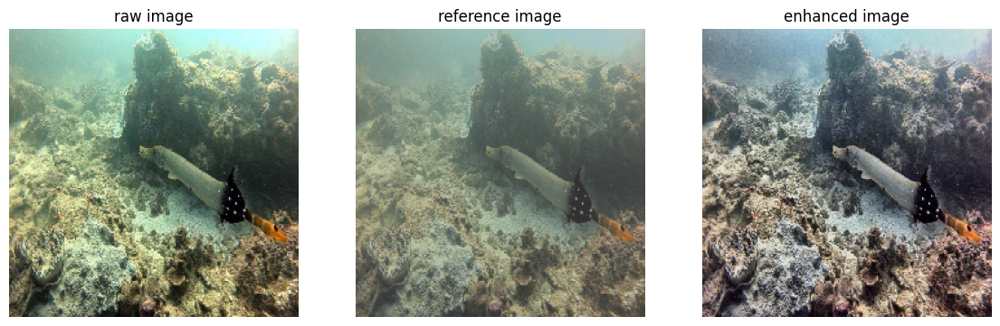

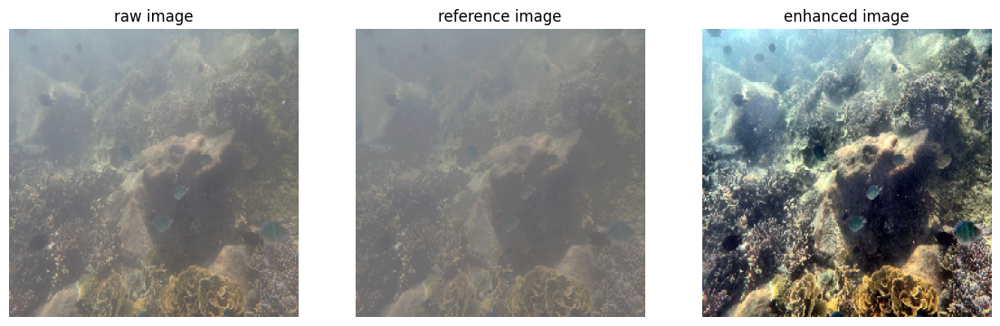

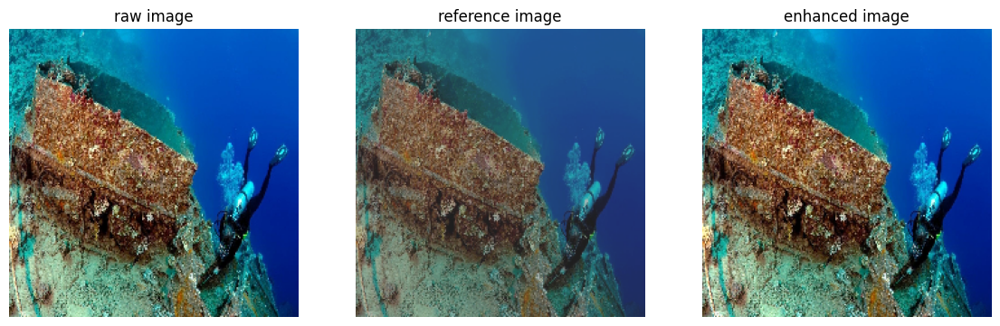

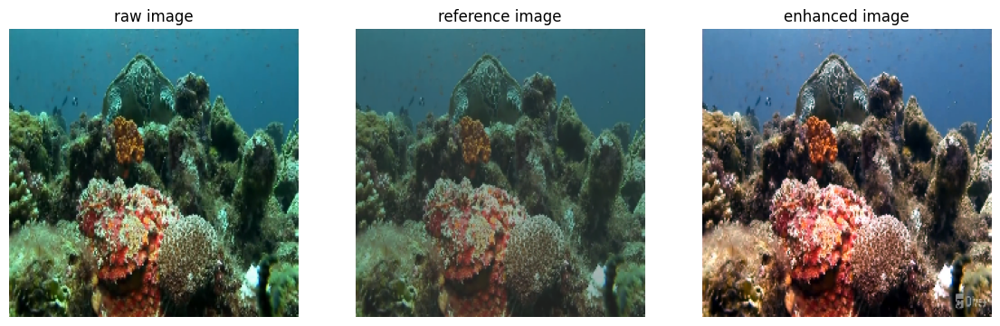

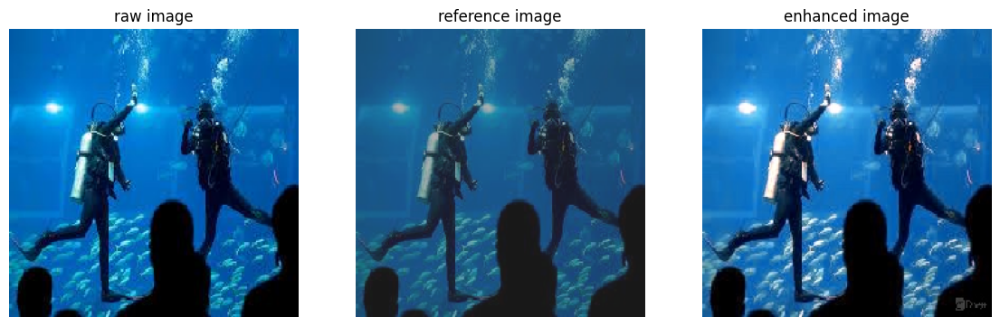

In [ ]:
TEST_Episodes = 5
ddqn.epsilon = 0
max_test_episode_step = 10

for e_test in range(TEST_Episodes):
    state = env.reset()
    done = False
    step_count = 1
    while not done:
        action = ddqn.select_action(state)
        new_state, _ = env.step(action)
        done = ddqn.check_if_done(state)
        state = new_state
        if done or step_count >= max_test_episode_step:
            env.render()
            break
        step_count += 1

### Quantitative Analysis

In [57]:
ddqn.epsilon = 0
max_test_episode_step = 10
total_mse = total_psnr = total_ssim = 0

for index, (raw_path, ref_path) in enumerate(zip(images_raw_test, images_ref_test)):
    state = env.reset(raw_path, ref_path)
    tot_rewards = 0
    done = False
    step_count = 1
    while not done:
        action = ddqn.select_action(state)
        new_state, reward = env.step(action)
        done = ddqn.check_if_done(state)
        tot_rewards += reward
        state = new_state
        if done or step_count >= max_test_episode_step:

            mse = mean_squared_error(
                np.array(env.current_image), np.array(env.reference_image)
            )
            psnr = peak_signal_noise_ratio(
                np.array(env.current_image), np.array(env.reference_image)
            )
            ssim = structural_similarity(
                im1=np.array(env.current_image),
                im2=np.array(env.reference_image),
                channel_axis=2,
            )
            print(
                "episode: {}/{}, steps: {}, episode reward: {}".format(
                    index, len(images_raw_test), step_count, tot_rewards
                )
            )
            total_mse += mse
            total_psnr += psnr
            total_ssim += ssim
            break
        step_count += 1

avg_mse = total_mse / len(images_raw_val)
avg_psnr = total_psnr / len(images_raw_val)
avg_ssim = total_ssim / len(images_raw_val)

print(
    "lr: {}, alpha: {}, beta: {}, episode: {} with max steps {}".format(
        learning_rate, alpha, beta, episodes, episode_max_steps
    )
)
print("avg mse: {}, avg_psnr: {}, avg ssim: {}".format(avg_mse, avg_psnr, avg_ssim))

episode: 0/178, steps: 1, episode reward: -0.13525400161743165
episode: 1/178, steps: 1, episode reward: -0.003408670425415039
episode: 2/178, steps: 1, episode reward: 1.337602472305298
episode: 3/178, steps: 1, episode reward: -0.6671427547931671
episode: 4/178, steps: 1, episode reward: 0.23356865644454955
episode: 5/178, steps: 1, episode reward: -0.12210292816162109
episode: 6/178, steps: 1, episode reward: -0.42619463205337527
episode: 7/178, steps: 1, episode reward: -0.2750101208686829
episode: 8/178, steps: 1, episode reward: -1.031464982032776
episode: 9/178, steps: 1, episode reward: -1.886199939250946
episode: 10/178, steps: 1, episode reward: -0.13281018733978273
episode: 11/178, steps: 1, episode reward: -0.16232035160064698
episode: 12/178, steps: 1, episode reward: 0.4331100344657898
episode: 13/178, steps: 1, episode reward: 0.42903766632080076
episode: 14/178, steps: 1, episode reward: -0.0098494291305542
episode: 15/178, steps: 1, episode reward: -0.5974106788635254
